## *instats* Workshop, November 18-22, 2024 
### https://instats.org/seminar/computational-network-science-using-pyth2

# COMPUTATIONAL NETWORK SCIENCE USING PYTHON
## Moses Boudourides

# IV. ELEMENTARY MOTIFS

<span style="color:green">
    
### [1. Cliques](#1)

### [2. Clustering](#2)

### [3. Triangles](#3)

### [4. Cycles](#4)

### [5. Ego-nets](#5)

</span>

In [1]:
# The modules (libraries) of Python which are used in this notebook:

import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import matplotlib.colors
from collections import Counter, defaultdict
import random, math
import numpy as np
import scipy as sp
import pickle, logging
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from networkx.drawing.nx_agraph import to_agraph
from pylab import hist
import itertools
# from IPython.core.display import Image, display

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning) 
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter('ignore')
# warnings.filterwarnings("ignore", category=DeprecationWarning, message="Importing display from IPython.core.display is deprecated since IPython 7.14")
warnings.filterwarnings("ignore", category=UserWarning, message=".*does not look like a valid URI.*")
warnings.filterwarnings("ignore", module="rdflib")
warnings.filterwarnings("ignore", category=UserWarning, module="rdflib")
logging.basicConfig(level=logging.ERROR)

In [2]:
def plot_clique_distribution(clique_data,name):
    sizes = list(clique_data.keys())
    counts = list(clique_data.values())    
    plt.figure(figsize=(8, 5))
    bars = plt.bar(sizes, counts, color='skyblue')
    plt.xlabel('Clique Size', fontsize=12)
    plt.ylabel('Number of Cliques', fontsize=12)
    plt.title(f"Distribution of Clique Sizes\n {name.title()}", fontsize=15)
    plt.xticks(sizes)  # Set x-axis ticks to show only actual clique sizes    
    # Set y-axis to integer values only
    plt.gca().yaxis.get_major_locator().set_params(integer=True)    
    # Annotate each bar with the corresponding count
    for bar, count in zip(bars, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2, 
            bar.get_height() + 0.01, 
            str(count), 
            ha='center', 
            va='bottom', 
            fontsize=10, 
            color='black'
        )    
    plt.show()
    
def clique_diagnostics(G, name, enu=1):
    # Number of cliques and maximum clique size
    nc = len(list(nx.find_cliques(G)))
    print(f"Number of cliques in {name} is {nc}")    
    # Approximation of the clique number
    clique_number = len(nx.approximation.max_clique(G))
    print(f"The approximate clique number of {name} is {clique_number}")    
    print(f"The clique number of {name} is {max(len(clique) for clique in list(nx.find_cliques(G)))}") 
    # Sorting cliques by size
    cliques = sorted(nx.find_cliques(G), key=lambda l: (len(l), l), reverse=True)    
    # Dictionary to store number of cliques of each size
    c_d = {}
    for c in cliques:
        size = len(c)
        c_d[size] = c_d.get(size, 0) + 1    
    for k, v in c_d.items():
        print(f"There are {v} cliques of size {k} ({k}-cliques)")            
    # Plot the distribution of cliques
    plot_clique_distribution(c_d,name)
    return nc, cliques
    # Optional: Print detailed clique information if enu is set to 1
    if enu == 1:     
        print("All the cliques are:")
        for i, c in enumerate(cliques):
            print(f"{i + 1}. {c}")
        return nc, cliques
    
def plot_cliques(G, nc, cliques, name):
    # Calculate the number of rows for subplots
    r = int(math.ceil(nc / 3.)) if (nc / 3.) % 3 != 0 else int(nc / 3.)    
    # Generate the positions using graphviz_layout
    pos = graphviz_layout(G)    
    # Adjust positions to match nodelist types
    pos = {str(k) if isinstance(list(G.nodes())[0], str) else int(k): v for k, v in pos.items()}
    fig, ax = plt.subplots(r, 3, figsize=(18, 2 * len(G)), sharex=True)    
    for i, clique in enumerate(cliques):
        row, col = divmod(i, 3)
        plt.sca(ax[row, col] if r > 1 else ax[col])  # Adjust indexing if r == 1        
        # Determine nodes inside and outside the clique
        outn = [n for n in G.nodes() if n not in clique]
        ine = [e for e in G.edges() if e[0] in clique and e[1] in clique]
        oute = [e for e in G.edges() if e not in ine]        
        # Standardize nodelist and ensure all nodes in nodelist are in pos
        clique = [str(n) if isinstance(list(G.nodes())[0], str) else int(n) for n in clique]
        outn = [str(n) if isinstance(list(G.nodes())[0], str) else int(n) for n in outn]
        # Draw nodes and edges for the current clique
        nx.draw_networkx_nodes(G, pos, nodelist=clique, node_size=500, node_color="magenta", alpha=0.5)
        nx.draw_networkx_nodes(G, pos, nodelist=outn, node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, edgelist=ine, width=7, edge_color="orange", alpha=0.6)
        nx.draw_networkx_edges(G, pos, edgelist=oute, edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)        
        # Set title and formatting for the subplot
        plt.title(f"[{i+1}] Clique of the {name}\nwith size {len(clique)}")
        plt.axis('off')
        plt.margins(x=0.2, y=0.2)    
    # Hide any empty subplots
    for j in range(len(cliques), r * 3):
        fig.delaxes(ax.flatten()[j])
    plt.tight_layout()
    plt.show()
            
def bipartite_graph_nodes_vs_cliques(G):
    G1=G.copy()
    X=G1.nodes()
    Y=[]
    eds=[]
    for n in X:
        for c in [clique for clique in list(nx.find_cliques(G1)) if n in clique]:
            c=[str(C) for C in c]
            cc="Clique of\n"+", ".join(c)
            if cc not in Y:
                Y.append(cc)
            eds.append((n,cc))
    Gbpc=nx.Graph()
    Gbpc.add_nodes_from(X, bipartite=0)
    Gbpc.add_nodes_from(Y, bipartite=1)
    Gbpc.add_edges_from(eds)
    return X,Y,Gbpc
            
def intersection_graph_from_bipartite(Gbpc):
    ceds=[]
    namedcliques=[n for n, d in Gbpc.nodes(data=True) if d["bipartite"] == 1]
    lcliques=[x.replace('Clique of\n',"").split(", ") for x in namedcliques]
    for j in list(itertools.combinations(lcliques,2)):
        ints=set(j[0]).intersection(set(j[1]))
        if len(ints)>0:
            ceds.append(("Clique of\n"+", ".join(j[0]),"Clique of\n"+", ".join(j[1]),len(ints)))
    # print(len(ceds))
    Gintrs=nx.Graph()
    Gintrs.add_weighted_edges_from(ceds)
    return Gintrs

def global_clustering_coefficient(G):
    # Calculate the number of triangles (closed triplets) in the graph
    triangles = sum(nx.triangles(G).values()) / 3  # Each triangle is counted three times
    # Calculate the number of triplets
    # A triplet is a set of three nodes connected by two or three edges
    triplets = 0
    for node in G:
        degree = G.degree[node]
        if degree >= 2:
            triplets += degree * (degree - 1) / 2
    # Compute the global clustering coefficient
    if triplets != 0:
        C = (3 * triangles) / triplets
    else:
        C = 0
    return C

def plot_local_clusters(G, name):
    nc=len(G.nodes)
    # Calculate the number of rows for subplots
    r = int(math.ceil(nc / 3.)) if (nc / 3.) % 3 != 0 else int(nc / 3.)    
    # Generate the positions using graphviz_layout
    pos = graphviz_layout(G)    
    # Adjust positions to match nodelist types
    pos = {str(k) if isinstance(list(G.nodes())[0], str) else int(k): v for k, v in pos.items()}
    fig, ax = plt.subplots(r, 3, figsize=(18, 2 * len(G)), sharex=True)    
    for i,j in list(enumerate(G.nodes)):
        plt.subplot(r,3,i+1);    
        cc=nx.clustering(G,j)
        neighs=list(nx.neighbors(G,j))
        cneighs=neighs+[j]
        eneighs=[]
        for e in G.edges():
            if (e[0]==j and e[1] in neighs) or (e[1]==j and e[0] in neighs):
                eneighs.append(e)
        eneighs1=[]
        for k in itertools.combinations(neighs, 2):
            if ((k[0],k[1]) in G.edges()) or ((k[1],k[0]) in G.edges()):
                eneighs1.append(k)
        outneighs=[n for n in G.nodes() if n not in cneighs]
        outeneighs=[e for e in G.edges() if e not in eneighs and e not in eneighs1]
        # Draw nodes and edges for the current clique
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=[j],node_size=500,node_color="magenta", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=neighs,node_size=500,node_color="mediumpurple", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outneighs,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, edgelist=eneighs,width=7,edge_color="khaki", alpha=0.9)
        nx.draw_networkx_edges(G, pos, edgelist=eneighs1,width=7,edge_color="orange", alpha=0.6)
        nx.draw_networkx_edges(G, pos, edgelist=outeneighs,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        # Set title and formatting for the subplot
        plt.title(f"Local clustering coefficient of {j} = {cc:.2f}")
        plt.axis('off');
        plt.margins(x=0.2, y=0.2)        
    # Hide any empty subplots
    if nc < r * 3:
        for j in range(nc, r * 3):
            fig.delaxes(ax.flatten()[j])
    plt.suptitle(f"Local clusters in the {name}", fontsize=25, x=0.5, y=1.001)
    plt.tight_layout()
    plt.show()
        
def plot_clustering_coefficient_histogram(G, name, bins=10):
    """
    Plots the histogram of the local clustering coefficients of the nodes in a graph,
    styled similarly to a bar plot.
    Parameters:
    G (networkx.Graph): The input graph.
    name (str): A name for the graph to display in the title (default is "Graph").
    bins (int): Number of bins for the histogram (default is 10).
    """
    # Compute the local clustering coefficients
    clustering_coeffs = list(nx.clustering(G).values())
    # Generate histogram data
    counts, bin_edges = np.histogram(clustering_coeffs, bins=bins)
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])  # Midpoint of each bin for bar positions
    # Plotting as bar plot
    plt.figure(figsize=(8, 5))
    bars = plt.bar(bin_centers, counts, width=(bin_edges[1] - bin_edges[0]), color='skyblue') # , edgecolor='black'
    plt.xlabel("Local Clustering Coefficient", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.title(f"Histogram of Local Clustering Coefficients\n{name.title()}", fontsize=15)
    # Annotate each bar with the corresponding count
    for bar, count in zip(bars, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2, 
            bar.get_height() + 0.01, 
            str(count), 
            ha='center', 
            va='bottom', 
            fontsize=10, 
            color='black'
        )   
    plt.tight_layout()
    plt.show()
    
def all_unique_triangles(G):
    triangles = set()
    cliques=list(nx.clique.enumerate_all_cliques(G))
    triangles=[ tuple(sorted(z)) for z in cliques if len(z)==3 ]
#     triangles=list(set(triangles)) 
#     for clique in nx.find_cliques(G):
#         if len(clique) == 3:
#             triangles.add(tuple(sorted(clique))) 
    return list(triangles), len(triangles)
    
def count_unique_triangles(G):
    # Calculate the total number of triangles, where each triangle is counted three times.
    triangle_count = sum(nx.triangles(G).values()) // 3
    return triangle_count
    
def plot_triangles(G, name, h):
    triangles, nc = all_unique_triangles(G)
    # Calculate the number of rows for subplots
    r = int(math.ceil(nc / 3.)) if (nc / 3.) % 3 != 0 else int(nc / 3.)    
    # Generate the positions using graphviz_layout
    pos = graphviz_layout(G)    
    # Adjust positions to match nodelist types
    pos = {str(k) if isinstance(list(G.nodes())[0], str) else int(k): v for k, v in pos.items()}
    fig, ax = plt.subplots(r, 3, figsize=(18, h * 0.4 * len(G)), sharex=True)    
    for i,j in list(enumerate(triangles)):
        plt.subplot(r,3,i+1);    
        outn=[n for n in G.nodes() if n not in j]
        ine=[e for e in G.edges() if e[0] in j and e[1] in j]
        oute=[e for e in G.edges() if e not in ine]
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=j,node_size=500,node_color="lime", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
        nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        # Set title and formatting for the subplot
        plt.title(f"[{i+1}] triangle")
        plt.axis('off');
        plt.margins(x=0.2, y=0.2)        
    # Hide any empty subplots
    if nc < r * 3:
        for j in range(nc, r * 3):
            fig.delaxes(ax.flatten()[j])
    plt.suptitle(f"Triangles in the {name}", fontsize=25, x=0.5, y=1.001)
    plt.tight_layout()
    plt.show()
    
def cycles2edges(G,cycles):
    eds=[]
    for cycle in cycles:
        for i in range(len(cycle)-1):
            if (cycle[i],cycle[i+1]) in G.edges():
                eds.append((cycle[i],cycle[i+1]))
            if (cycle[i+1],cycle[i]) in G.edges():
                eds.append((cycle[i+1],cycle[i]))
        if (cycle[-1],cycle[0]) in G.edges():
                eds.append((cycle[-1],cycle[0]))
        if (cycle[0],cycle[-1]) in G.edges():
                eds.append((cycle[0],cycle[-1]))
    return eds

def all_cycles(G, name):
    scycles = list(nx.simple_cycles(G))
    cy_d = {}
    for cycle in scycles:
        k = len(cycle)
        if k not in cy_d:
            cy_d[k] = []
        cy_d[k].append(cycle)
    sorted_cy_d = dict(sorted(cy_d.items(), key=lambda x: x[0], reverse=True))
    return sorted_cy_d

# def all_cycles_basis(G, name):
#     # Get the cycle basis (unique simple cycles) for an undirected graph
#     scycles = list(nx.cycle_basis(G))
#     cy_d = {}
#     for cycle in scycles:
#         k = len(cycle)
#         if k not in cy_d:
#             cy_d[k] = []
#         cy_d[k].append(cycle)
#     # Sort dictionary in descending order by cycle length (key)
#     sorted_cy_d = dict(sorted(cy_d.items(), key=lambda x: x[0], reverse=True))
#     return sorted_cy_d

def plot_cycles(G, name, h):
    cy_d=all_cycles(G, name)
    nc=len(cy_d)
    # Calculate the number of rows for subplots
    r = int(math.ceil(nc / 3.)) if (nc / 3.) % 3 != 0 else int(nc / 3.)    
    # Generate the positions using graphviz_layout
    pos = graphviz_layout(G)    
    # Adjust positions to match nodelist types
    pos = {str(k) if isinstance(list(G.nodes())[0], str) else int(k): v for k, v in pos.items()}
    fig, ax = plt.subplots(r, 3, figsize=(18, h * 0.4 * len(G)), sharex=True)    
    for i,(k,v) in enumerate(cy_d.items()):
        plt.subplot(r,3,i+1);    
        sj = [item for sublist in v for item in sublist]
        outn=[n for n in G.nodes() if n not in sj]
        ine=cycles2edges(G,v)
        oute=[e for e in G.edges() if e not in ine]
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=sj,node_size=500,node_color="lime", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
        nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        # Set title and formatting for the subplot
        plt.title(f"[{i+1}] {len(v)} {k}-cycle")
        plt.axis('off');
        plt.margins(x=0.2, y=0.2)        
    # Hide any empty subplots
    if nc < r * 3:
        for j in range(nc, r * 3):
            fig.delaxes(ax.flatten()[j])
    plt.suptitle(f"Cycles in the {name}", fontsize=25, x=0.5, y=1.001)
    plt.tight_layout()
    plt.show()

def plot_egonets(G, name, h):
    en_d={}
    for n in G.nodes():
        eng=nx.ego_graph(G, n, undirected=True)
        if len(eng.nodes())>2:
            en_d[n]=(n,eng)
    print(f"{len(en_d)} nontrivial ego-nets of the {name}")
    nc=len(en_d.values())
    # Calculate the number of rows for subplots
    r = int(math.ceil(nc / 3.)) if (nc / 3.) % 3 != 0 else int(nc / 3.)    
    # Generate the positions using graphviz_layout
    pos = graphviz_layout(G)    
    # Adjust positions to match nodelist types
    pos = {str(k) if isinstance(list(G.nodes())[0], str) else int(k): v for k, v in pos.items()}
    fig, ax = plt.subplots(r, 3, figsize=(18, h * 0.4 * len(G)), sharex=True)    
    for i,(k,v) in enumerate(en_d.items()):
        plt.subplot(r,3,i+1);    
        jj=v[1]
        ce=v[0]
        inn=list(jj.nodes())
        inna=[n for n in inn if n!=ce]
        outn=[n for n in G.nodes() if n not in inn]
        ine=list(jj.edges())
        oute=[e for e in G.edges() if e not in ine]
        cc=nx.clustering(G,ce)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=[ce],node_size=500,node_color="gold", alpha=0.7)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=inna,node_size=500,node_color="lime", alpha=0.5)
        nodes = nx.draw_networkx_nodes(G, pos, nodelist=outn,node_color="g", alpha=0.13)
        nx.draw_networkx_edges(G, pos, edgelist=ine,width=7,edge_color="dodgerblue", alpha=0.6)
        nx.draw_networkx_edges(G, pos, edgelist=oute,edge_color="b", alpha=0.3)
        nx.draw_networkx_labels(G, pos)
        # Set title and formatting for the subplot
        plt.title(f"[{i+1}] nontrivial ego-net centered at {ce}\nwith clustering coefficient {cc:.2f}")
        plt.axis('off');
        plt.margins(x=0.2, y=0.2)        
    # Hide any empty subplots
    if nc < r * 3:
        for j in range(nc, r * 3):
            fig.delaxes(ax.flatten()[j])
    plt.suptitle(f"Ego-nets in the {name}", fontsize=25, x=0.5, y=1.001)
    plt.tight_layout()
    plt.show()

<a id='1'></a>
## <span style="color:green">1. Cliques</span>

* **Clique** is a subset of nodes of an *undirected graph* such that every pair of nodes in the clique are adjacent. <u>Cliques are not defined for directed graphs (and cliques in weighted graphs correspond to the cliques of the underlying simple graph).</u> 


* Apparently, the induced subgraph of a clique is a complete graph.


* The **size** of a clique is the number of its nodes.


* Defining **k-clique** to be a clique of size $k$ (that is, a clique of $k$ nodes), we observe the following specific cases:

- **1-clique** is a **point** (node),
- **2-clique** is an **edge** (link) or dyad (of nodes),
- **3-clique** is a **triplet** (**triangle**),
- **4-clique** is a **quatruple**,
- **5-clique** is a **quintuple**.


* A **maximal clique** is a clique that is not contained within any larger (in size) clique in the graph. 

* <u>In our discussion here, all cliques considered will be maximal.</u>

* The problem of finding *whether there is a clique of a given size in a graph* (i.e., the so called *clique problem*) is NP-complete.


*  A **maximum clique** of a graph is a clique with the largest possible size (i.e., the largest possible number of nodes) among all cliques in the graph. Moreover, the **clique number** $\omega(G)$ of a graph $G$ is the size of its maximum clique.

### A Toy Graph Example

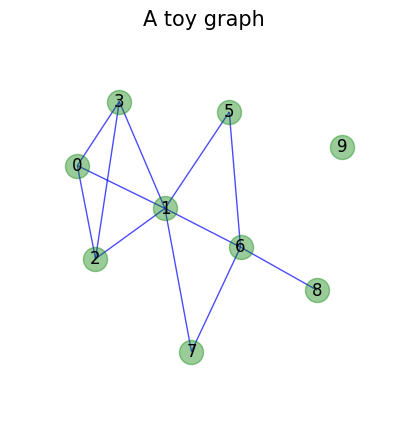

In [3]:
G=nx.complete_graph(4)
G.add_edges_from([(1,5),(5,6),(7,1),(7,6),(1,6),(6,8)])
G.add_node(9)
name="toy graph"

pos=graphviz_layout(G)
plt.figure(figsize=(5,5));
nodes = nx.draw_networkx_nodes(G, pos, node_color="g", alpha=0.4)
nx.draw_networkx_edges(G, pos,edge_color="b", alpha=0.7)
nx.draw_networkx_labels(G, pos)
plt.axis('off');
plt.title("A "+name,fontsize=15);
plt.margins(x=0.2, y=0.2)

Number of cliques in toy graph is 5
The approximate clique number of toy graph is 4
The clique number of toy graph is 4
There are 1 cliques of size 4 (4-cliques)
There are 2 cliques of size 3 (3-cliques)
There are 1 cliques of size 2 (2-cliques)
There are 1 cliques of size 1 (1-cliques)


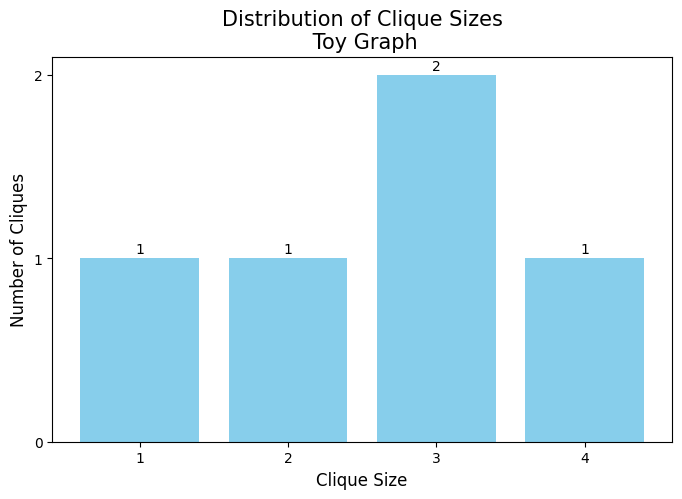

In [4]:
nc, cliques=clique_diagnostics(G,name,enu=1)

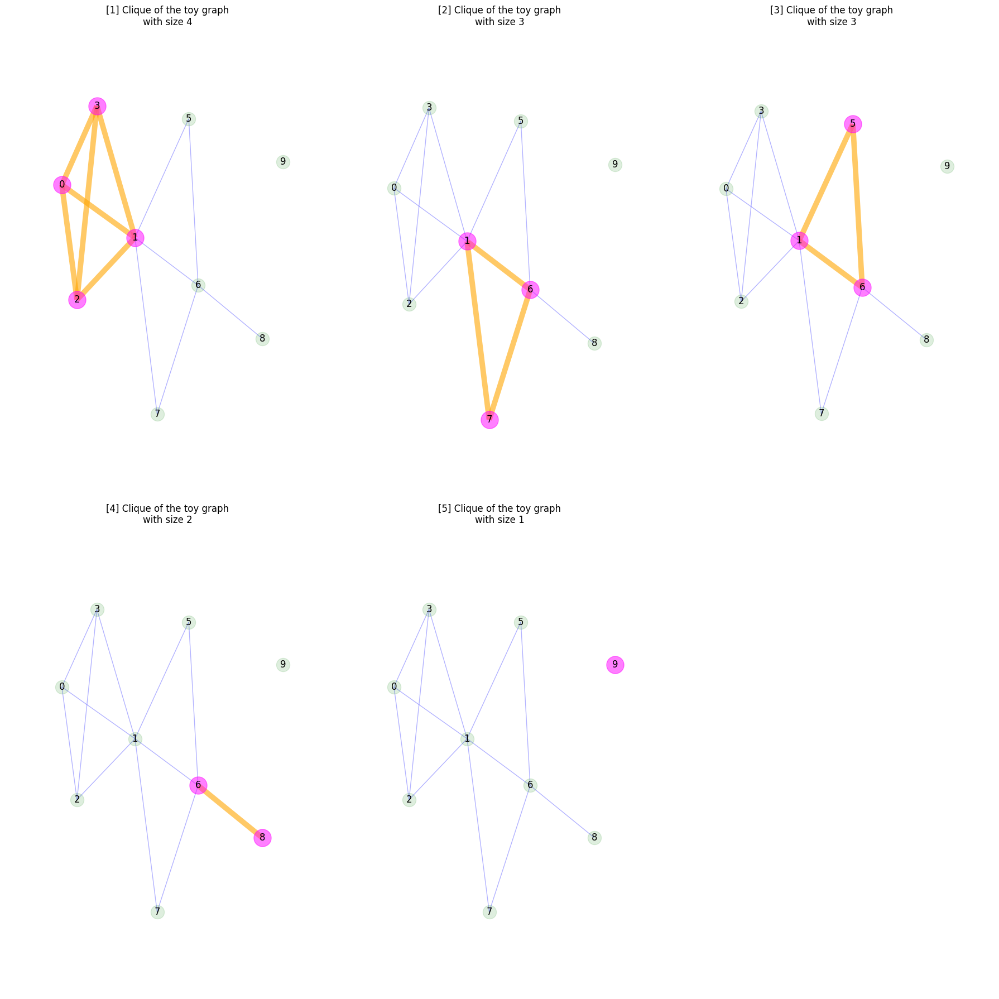

In [5]:
plot_cliques(G, nc, cliques, name)

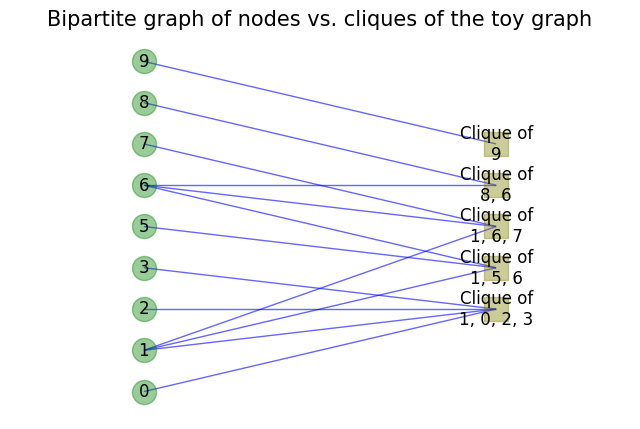

In [6]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
y_elevation = (len(X)-len(Y))/2
for j, y in enumerate(Y):
    pos[y] = (1, j + y_elevation)     
plt.figure(figsize=(8,5));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

Counter({1: 4, 2: 1})


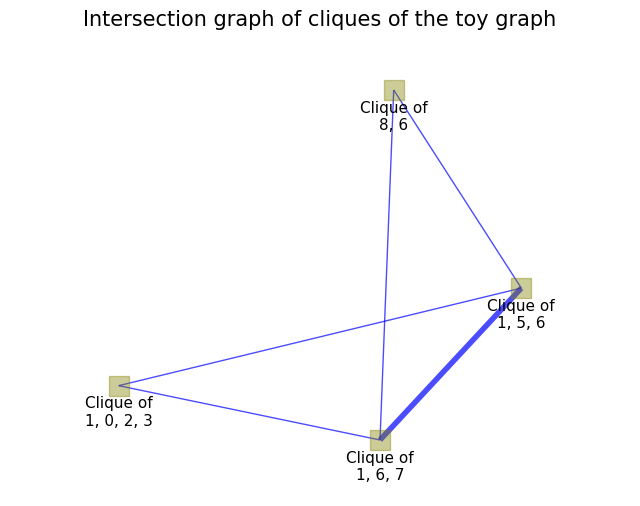

In [7]:
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))
edge_width=[1 if w == 1 else 4 for w in edge_width]
pos=graphviz_layout(Gintrs)
plt.figure(figsize=(8,6));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.7)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
yoffset = {}
y_off=-7
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=11);
plt.margins(x=0.2, y=0.1) 

### Intersection Graphs

An **intersection graph** is a graph where each vertex corresponds to a set, and two vertices are adjacent if and only if the corresponding sets intersect. Formally, let $ \mathcal{S} = \{ S_1, S_2, \dots, S_n \} $ be a family of sets. The **intersection graph** $ G = (V, E) $ associated with $ \mathcal{S} $ is a weighted graph defined as follows:

- The set of vertices $ V $ is $ \{v_1, v_2, \dots, v_n\} $, where each vertex $ v_i $ corresponds to the set $ S_i \in \mathcal{S} $.
- There is an edge between two vertices $ v_i $ and $ v_j $ if and only if $ S_i \cap S_j \neq \emptyset $, i.e., the sets $ S_i $ and $ S_j $ have a non-empty intersection, and the weight of this edge is equal to the cardinality of the intersection $ |S_i \cap S_j| $.

**Intersection graph of sets in bipartite graphs**:
Let $ G = (U, V, E) $ be a **bipartite graph** with bipartition $ U $ and $ V $. The **intersection graph of the neighbors** of the nodes in one partition, say $ V $, is constructed as follows:

- Each vertex in the intersection graph corresponds to a neighbor of a node in $ V $. That is, for each node $ v \in V $, the set of neighbors of $ v $ in $ G $, denoted as $ N(v) $, will correspond to a vertex in the intersection graph.
- There is an edge between two vertices in the intersection graph if and only if the corresponding sets of neighbors intersect. More formally, there is an edge between two vertices $ v_i, v_j $ in the intersection graph if and only if $ N(v_i) \cap N(v_j) \neq \emptyset $, and the weight of this edge is equal to the cardinality of the intersection $ |N(v_i) \cap N(v_j)| $.

### The Florentine Families Graph

Number of cliques in Florentine Families graph is 15
The approximate clique number of Florentine Families graph is 3
The clique number of Florentine Families graph is 3
There are 3 cliques of size 3 (3-cliques)
There are 12 cliques of size 2 (2-cliques)


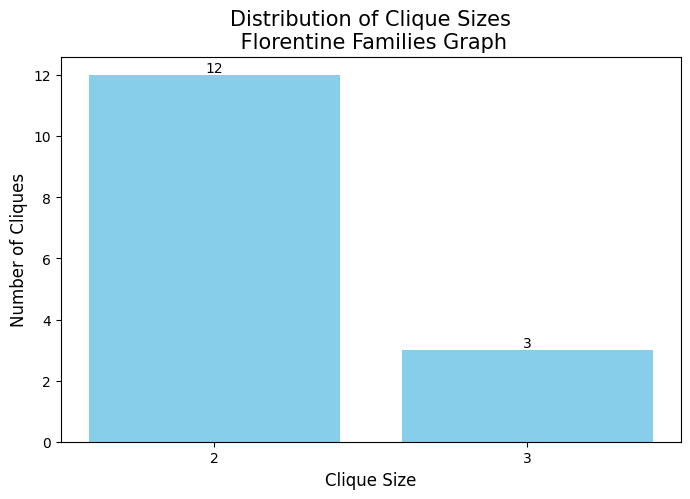

In [8]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"
nc, cliques=clique_diagnostics(G,name,enu=1)

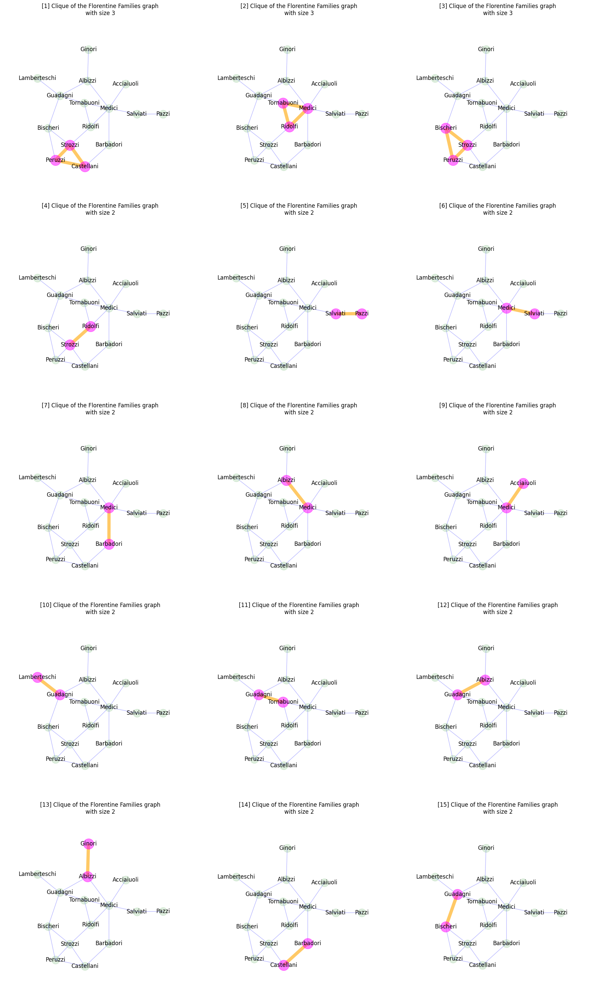

In [9]:
plot_cliques(G, nc, cliques, name)

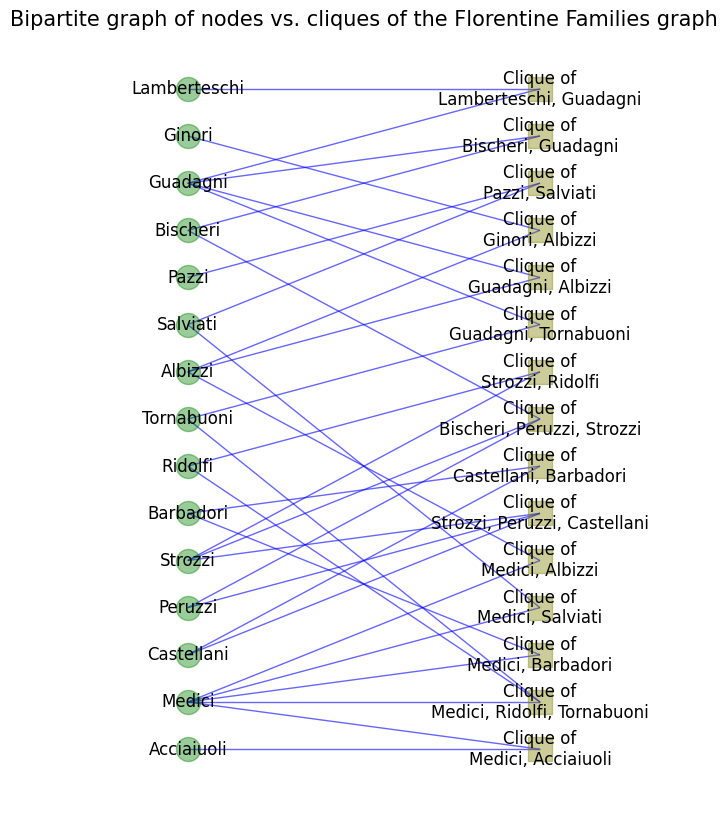

In [10]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
y_elevation = (len(X)-len(Y))/2
for j, y in enumerate(Y):
    pos[y] = (1, j + y_elevation)     
plt.figure(figsize=(8,10));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

Counter({1: 27, 2: 1})


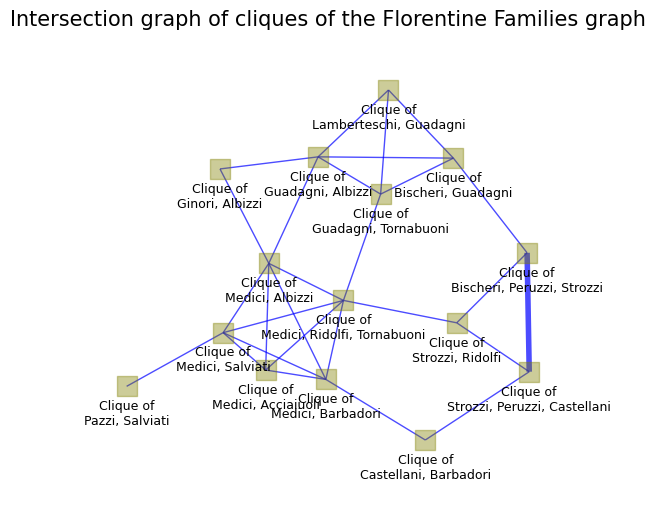

In [11]:
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))
edge_width=[1 if w == 1 else 4 for w in edge_width]
pos=graphviz_layout(Gintrs)
plt.figure(figsize=(8,6));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.7)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
yoffset = {}
y_off=-20
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=9);
plt.margins(x=0.2, y=0.1) 

### Cliques of the Karate Club Graph

Number of cliques in Karate Club graph is 36
The approximate clique number of Karate Club graph is 5
The clique number of Karate Club graph is 5
There are 2 cliques of size 5 (5-cliques)
There are 2 cliques of size 4 (4-cliques)
There are 21 cliques of size 3 (3-cliques)
There are 11 cliques of size 2 (2-cliques)


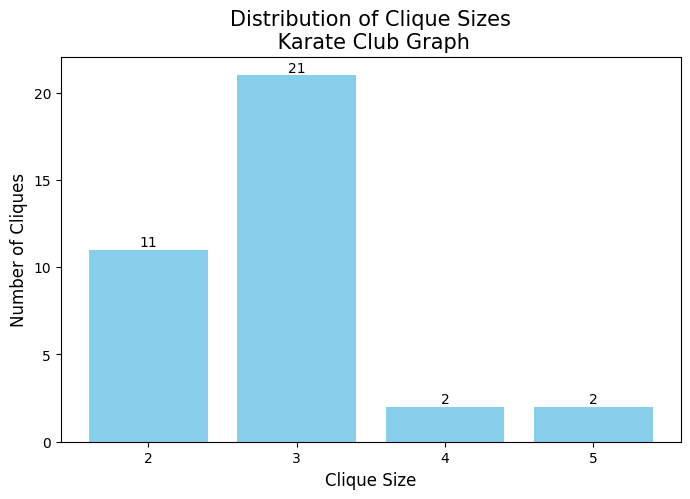

In [12]:
G=nx.karate_club_graph()
name = "Karate Club graph"
nc, cliques=clique_diagnostics(G,name,enu=1)

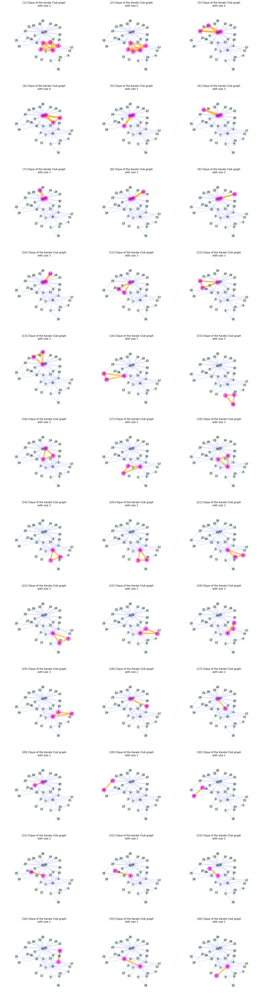

In [13]:
plot_cliques(G, nc, cliques, name)

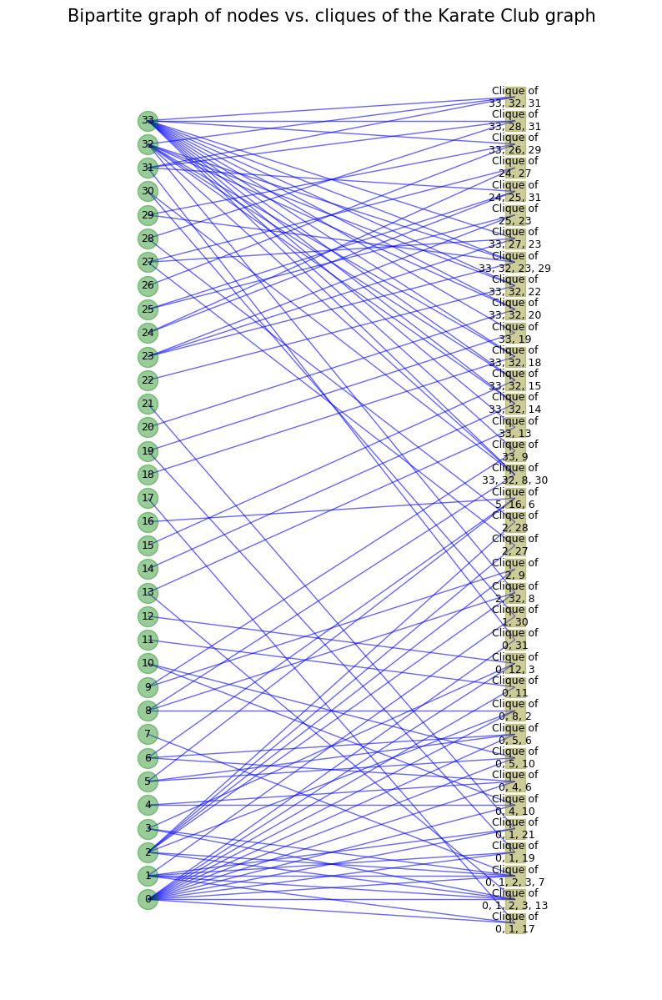

In [14]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
y_elevation = (len(X)-len(Y))/2
for j, y in enumerate(Y):
    pos[y] = (1, j + y_elevation)     
plt.figure(figsize=(10,15));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos,font_size=9)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

Counter({1: 169, 2: 51, 4: 1})


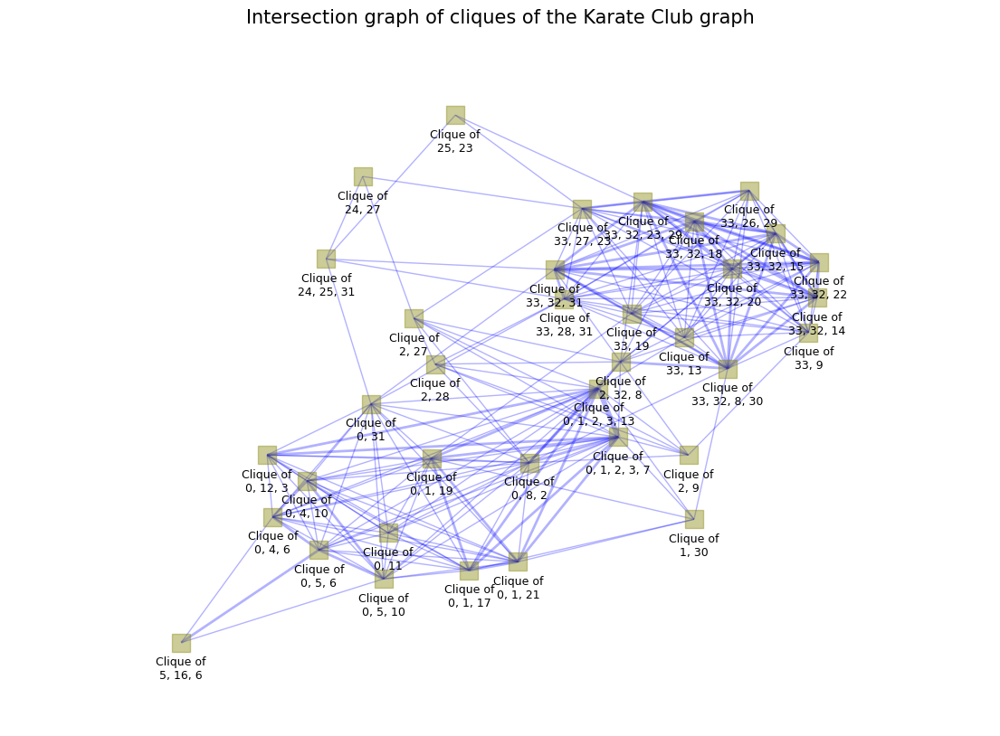

In [15]:
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))
pos=graphviz_layout(Gintrs)
x='Clique of\n0, 1, 2, 3, 13'
pos[x]=[pos[x][0]+40,pos[x][1]+30]
x='Clique of\n0, 1, 2, 3, 7'
pos[x]=[pos[x][0]+40,pos[x][1]+30]
plt.figure(figsize=(14,10));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.3)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
# nx.draw_networkx_labels(Gintrs, pos);
yoffset = {}
y_off=-15
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=9);
plt.margins(x=0.2, y=0.1)  

### An Erdos-Renyi Random Graph

Number of cliques in Erdos-Renyi random graph is 23
The approximate clique number of Erdos-Renyi random graph is 2
The clique number of Erdos-Renyi random graph is 3
There are 2 cliques of size 3 (3-cliques)
There are 21 cliques of size 2 (2-cliques)


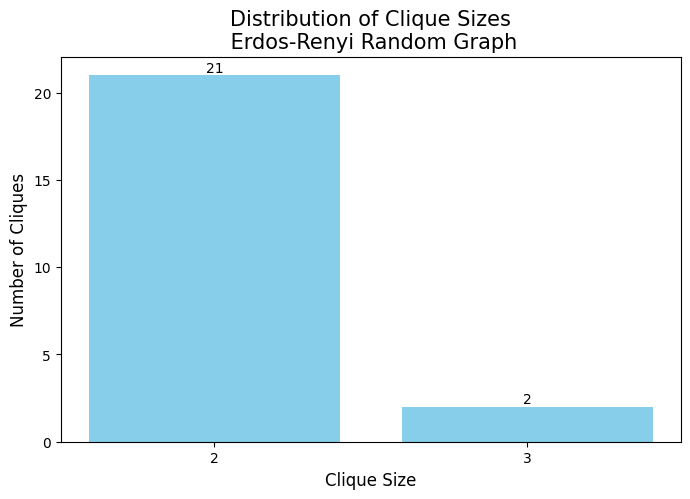

In [16]:
while True:
    n=random.randint(15,26)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p)
    if nx.is_connected(G)==False and len(list(nx.isolates(G)))==0 and len(list(nx.find_cliques(G)))>3:
        break
name = "Erdos-Renyi random graph"
nc, cliques=clique_diagnostics(G,name,enu=1)

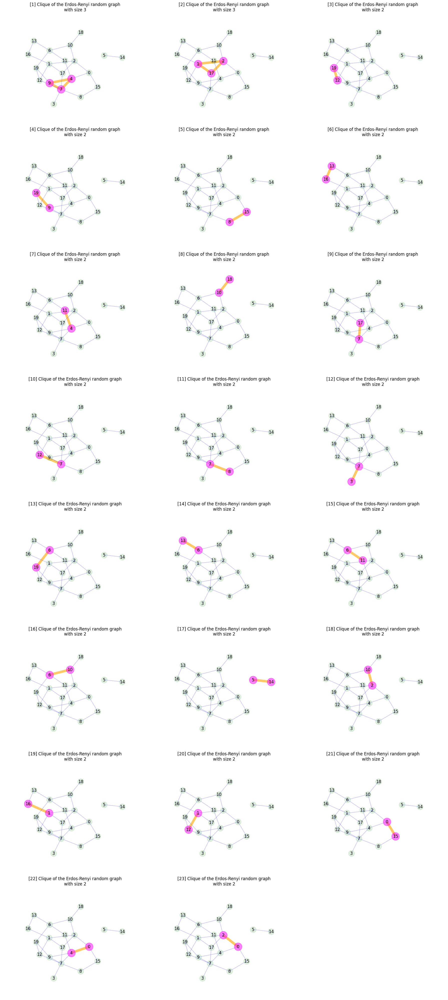

In [17]:
plot_cliques(G, nc, cliques, name)

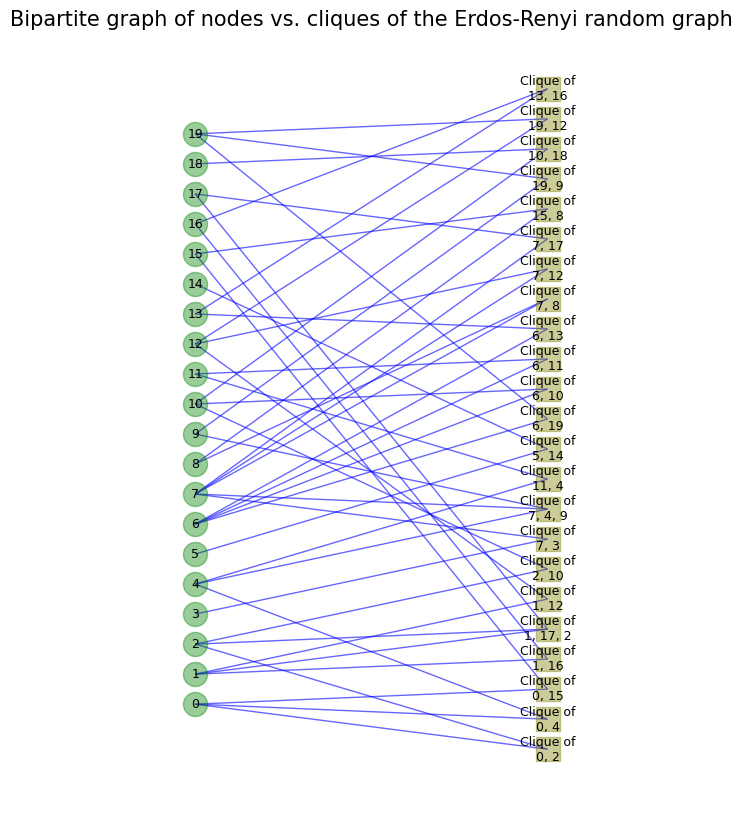

In [18]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
pos={}
for i,x in list(enumerate(X)):
    pos[x]=(0,i)
for j,y in list(enumerate(Y)):
    pos[y]=(1,j)
y_elevation = (len(X)-len(Y))/2
for j, y in enumerate(Y):
    pos[y] = (1, j + y_elevation)     
plt.figure(figsize=(8,10));
nodes1 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(X), node_color="g", alpha=0.4)
nodes2 = nx.draw_networkx_nodes(Gbpc, pos, nodelist=list(Y), node_shape='s',node_color="olive", alpha=0.4)
nx.draw_networkx_edges(Gbpc, pos,arrowsize=20, edge_color="b", alpha=0.6)
nx.draw_networkx_labels(Gbpc, pos,font_size=9)
plt.axis('off');
st="Bipartite graph of nodes vs. cliques of the %s" %name
plt.title(st,fontsize=15);
plt.margins(x=0.3, y=0.03) 

Counter({1: 44})


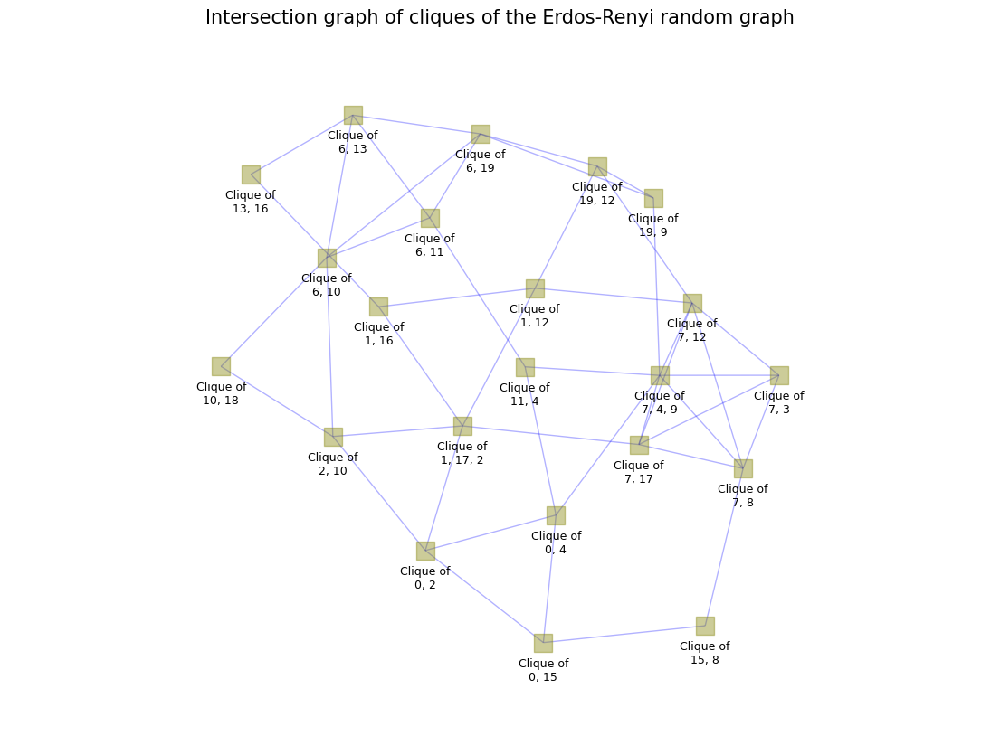

In [19]:
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))       
pos=graphviz_layout(Gintrs)
plt.figure(figsize=(14,10));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=200,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.3)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
# nx.draw_networkx_labels(Gintrs, pos);
yoffset = {}
y_off=-15
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=9);
plt.margins(x=0.3, y=0.1)  

### The Dolphins Graph

Number of cliques in Dolphins graph is 84
The approximate clique number of Dolphins graph is 4
The clique number of Dolphins graph is 5
There are 3 cliques of size 5 (5-cliques)
There are 13 cliques of size 4 (4-cliques)
There are 30 cliques of size 3 (3-cliques)
There are 38 cliques of size 2 (2-cliques)


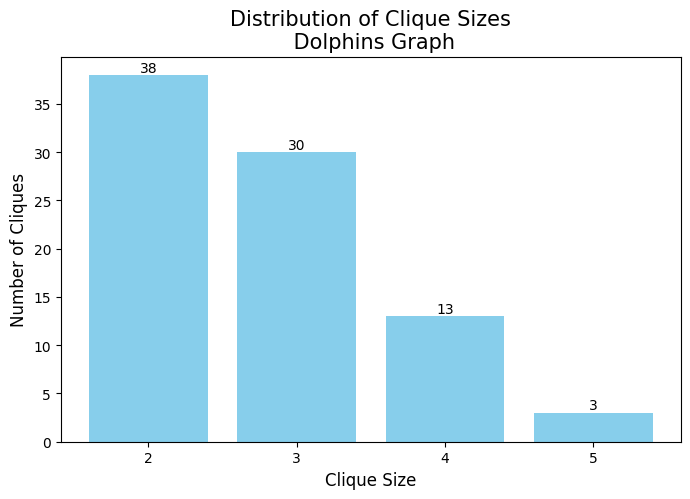

In [20]:
G = nx.read_gml("dolphins.gml")
name="Dolphins graph"
nc, cliques=clique_diagnostics(G,name,enu=1)

Counter({1: 312, 2: 59, 3: 18, 4: 1})


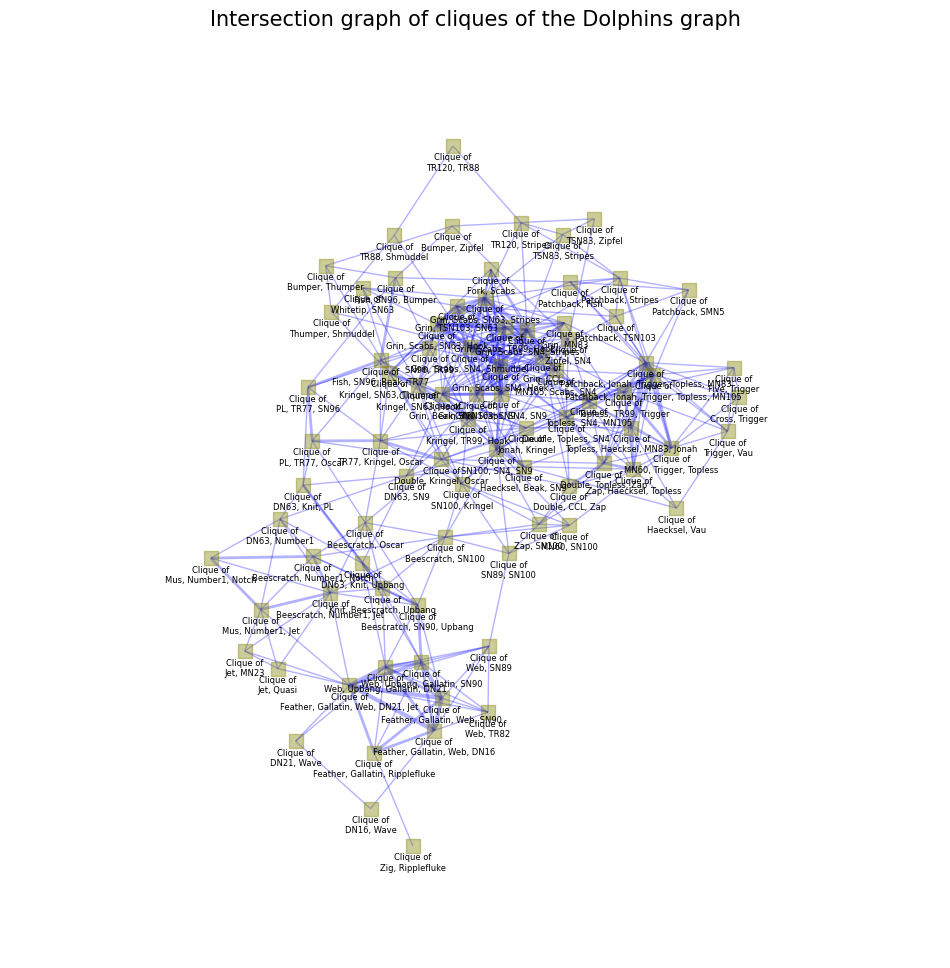

In [21]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))       
pos=graphviz_layout(Gintrs)
plt.figure(figsize=(12,12));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=100,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.3)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
yoffset = {}
y_off=-15
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=6);
plt.margins(x=0.3, y=0.1)  

### The Graph of Les Miserables

Number of cliques in graph of Les Miserables is 59
The approximate clique number of graph of Les Miserables is 8
The clique number of graph of Les Miserables is 10
There are 2 cliques of size 10 (10-cliques)
There are 2 cliques of size 8 (8-cliques)
There are 5 cliques of size 7 (7-cliques)
There are 2 cliques of size 6 (6-cliques)
There are 5 cliques of size 5 (5-cliques)
There are 11 cliques of size 4 (4-cliques)
There are 10 cliques of size 3 (3-cliques)
There are 22 cliques of size 2 (2-cliques)


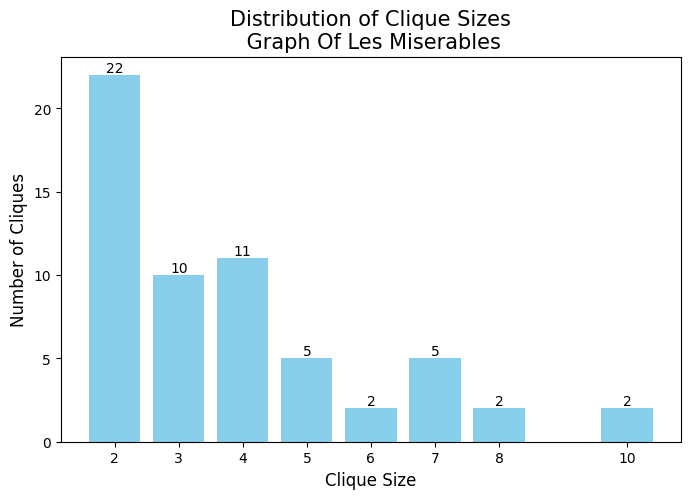

In [22]:
G=nx.les_miserables_graph()
name="graph of Les Miserables"
nc, cliques=clique_diagnostics(G,name,enu=1)

Counter({1: 393, 2: 109, 3: 27, 4: 9, 5: 6, 6: 3, 8: 1, 7: 1})


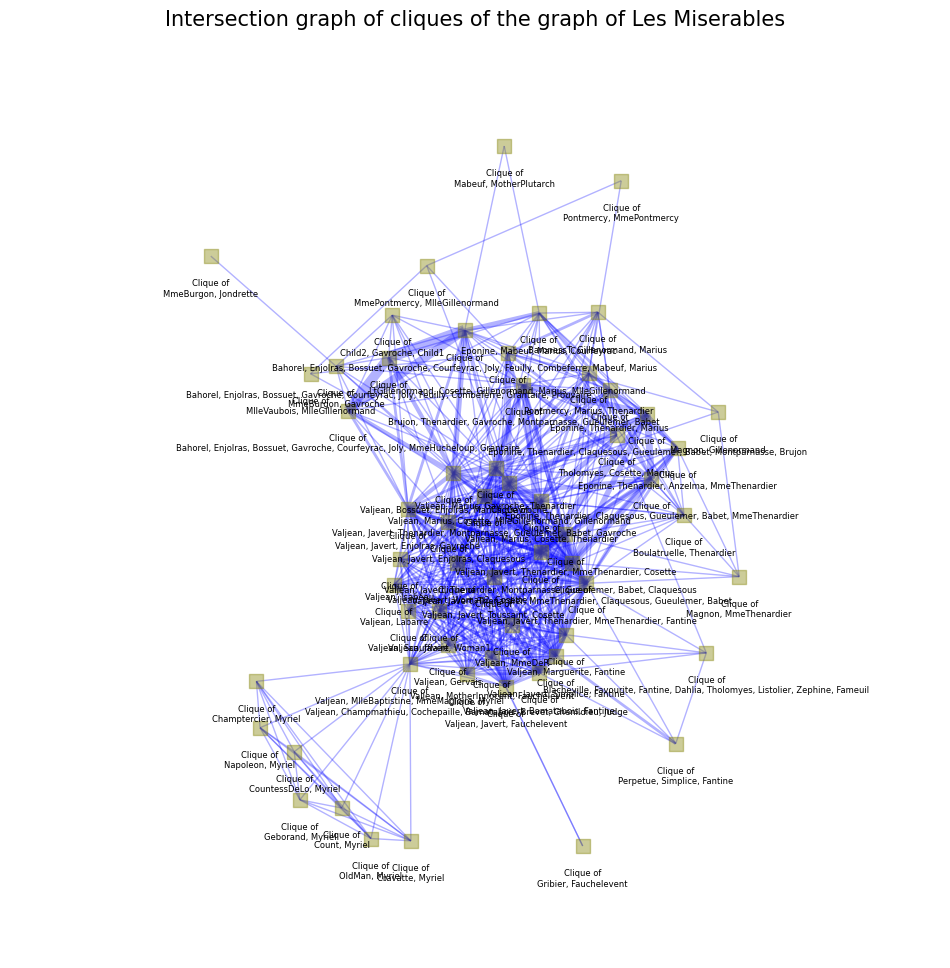

In [23]:
X,Y,Gbpc=bipartite_graph_nodes_vs_cliques(G)
Gintrs=intersection_graph_from_bipartite(Gbpc)
edge_width=[Gintrs[u][v]['weight'] for u,v in Gintrs.edges()] 
edge_width=[w for w in edge_width]
print(Counter(edge_width))       
pos=graphviz_layout(Gintrs)
plt.figure(figsize=(12,12));
nodes = nx.draw_networkx_nodes(Gintrs, pos, node_shape='s', node_size=100,node_color='olive',alpha=0.4) 
nx.draw_networkx_edges(Gintrs, pos,width=edge_width, edge_color="b", alpha=0.3)
plt.axis('off');
st="Intersection graph of cliques of the %s" %name
plt.title(st,fontsize=15);
yoffset = {}
y_off=-15
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gintrs, yoffset,font_size=6);
plt.margins(x=0.3, y=0.1)  

### The Graph of American Football Games

Number of cliques in graph of American Football Games is 281
The approximate clique number of graph of American Football Games is 8
The clique number of graph of American Football Games is 9
There are 2 cliques of size 9 (9-cliques)
There are 2 cliques of size 8 (8-cliques)
There are 1 cliques of size 7 (7-cliques)
There are 6 cliques of size 6 (6-cliques)
There are 52 cliques of size 5 (5-cliques)
There are 58 cliques of size 4 (4-cliques)
There are 64 cliques of size 3 (3-cliques)
There are 96 cliques of size 2 (2-cliques)


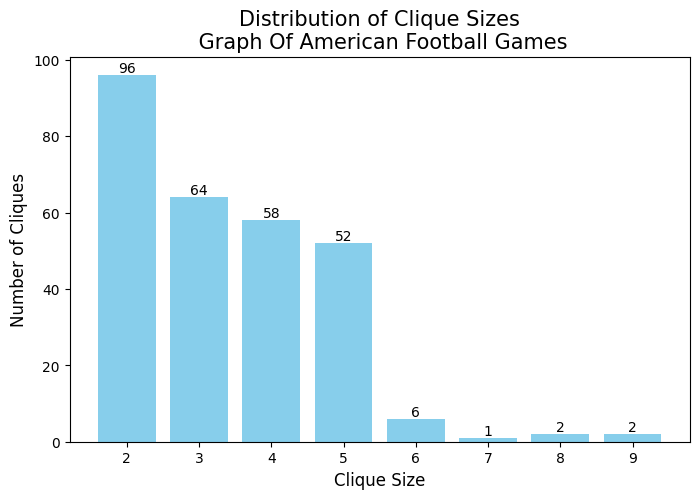

In [24]:
with open("AmericanFootballGraph.pickle", "rb") as f:
    G = pickle.load(f)
nc, cliques=clique_diagnostics(G,name="graph of American Football Games",enu=1)

### The Graph of Jazz Musicians

Number of cliques in graph of Jazz Musicians is 746
The approximate clique number of graph of Jazz Musicians is 28
The clique number of graph of Jazz Musicians is 30
There are 1 cliques of size 30 (30-cliques)
There are 1 cliques of size 20 (20-cliques)
There are 2 cliques of size 18 (18-cliques)
There are 2 cliques of size 17 (17-cliques)
There are 11 cliques of size 16 (16-cliques)
There are 16 cliques of size 15 (15-cliques)
There are 29 cliques of size 14 (14-cliques)
There are 42 cliques of size 13 (13-cliques)
There are 67 cliques of size 12 (12-cliques)
There are 89 cliques of size 11 (11-cliques)
There are 108 cliques of size 10 (10-cliques)
There are 147 cliques of size 9 (9-cliques)
There are 52 cliques of size 8 (8-cliques)
There are 46 cliques of size 7 (7-cliques)
There are 48 cliques of size 6 (6-cliques)
There are 44 cliques of size 5 (5-cliques)
There are 14 cliques of size 4 (4-cliques)
There are 19 cliques of size 3 (3-cliques)
There are 8 cliques of size 2 (2-cliques

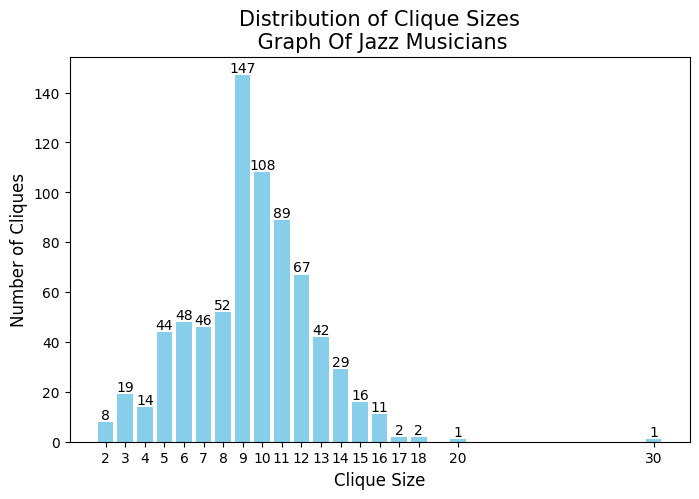

In [25]:
with open("jazz.pickle", "rb") as f:
    G = pickle.load(f)
nc, cliques=clique_diagnostics(G,name="graph of Jazz Musicians",enu=1)

In [26]:
# with open("LastFMAsiaSN.pickle", "rb") as f:
#     G = pickle.load(f)
# nc, cliques=clique_diagnostics(G,name="graph of LastFM Asia Friends",enu=1)
# Number of cliques of the graph of LastFM Asia Friends is 17957

<a id='2'></a>
## <span style="color:green">2. Clustering</span>

Let $G = (V,E)$ be a graph and $u ∈ V$ a node.


The **local clustering coefficient** of node $u$ is defined as the proportion of the number of links between the neighbors of $u$ divided by the number of links that could possibly exist between these neighbors:

$$C(u) = \frac{2|\{e = (v,w) ∈ E: v, w ∈ N(u)\}|}{deg(u)(deg(u) - 1)},$$

where $N(u)$ denotes the neighborhood of $u$ and $deg(u)$ the degree of $u$. Apparently, this definition refers to an undirected graph, but under the usual modifications it is valid for directed and weighted graphs too (see: G. Fagiolo (2007), "Clustering in complex directed networks," Physical Review E, 76(2), 026107 https://www.iris.sssup.it/retrieve/handle/11382/303163/847/PRE_2007.pdf).

The **global clustering coefficient** is based on triplets of nodes. A triplet is three nodes that are connected by either two (**open triplet**) or three (**closed triplet**) undirected ties. A triangle in the graph therefore includes three closed triplets, one centered on each of the nodes. The global clustering coefficient of the graph $G$ is then defined as:

$$C = \frac{\mbox{number of closed triplets}}{\mbox{number of all triplets (open and closed)}} = \frac{\mbox{3 $\times$ number of triangles}}{\mbox{number of all triplets}}$$

This has been generalized to weighted graphs by Tore Opsahl & Pietro Panzarasa (2009), "Clustering in Weighted Networks," Social Networks, 31(2): 155–163. doi:10.1016/j.socnet.2009.02.002.

The **graph average clustering coefficient** is defined as the average of the local clustering coefficients of all the vertices of the graph:

$$\bar{C} = \frac{1}{n} \sum_{u ∈ V} C(u)$$

where $n$ is the number of nodes of the graph (i.e., $|V| = n$).

### The Florentine Families Graph

Global clustering coefficient of the Florentine Families graph = 0.19
Average clustering coefficient of the Florentine Families graph = 0.16


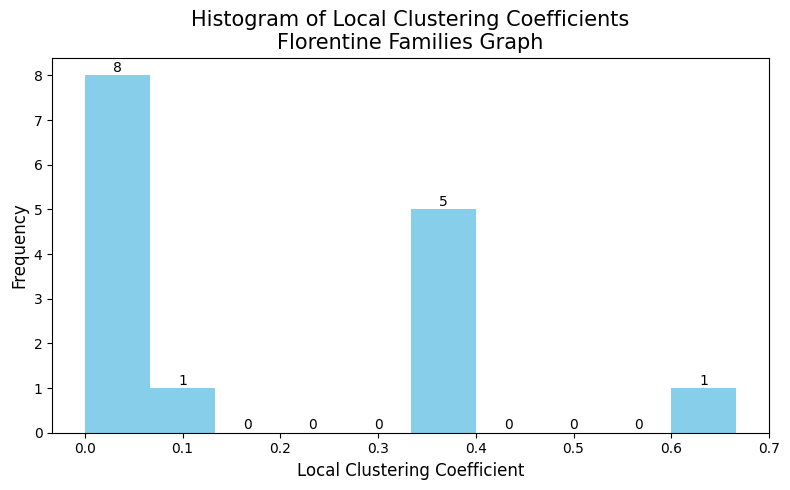

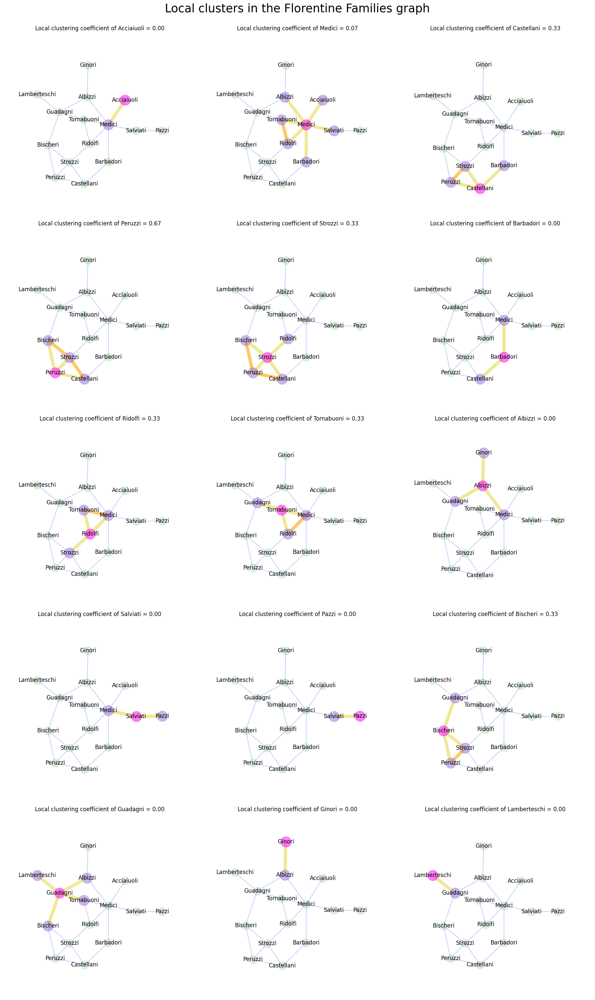

In [27]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)
plot_local_clusters(G, name)

### The Karate Club Graph

Global clustering coefficient of the Karate Club graph = 0.26
Average clustering coefficient of the Karate Club graph = 0.57


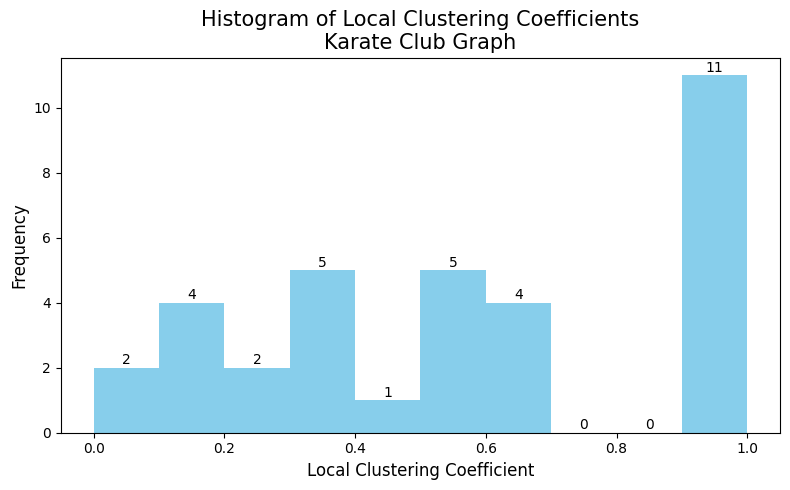

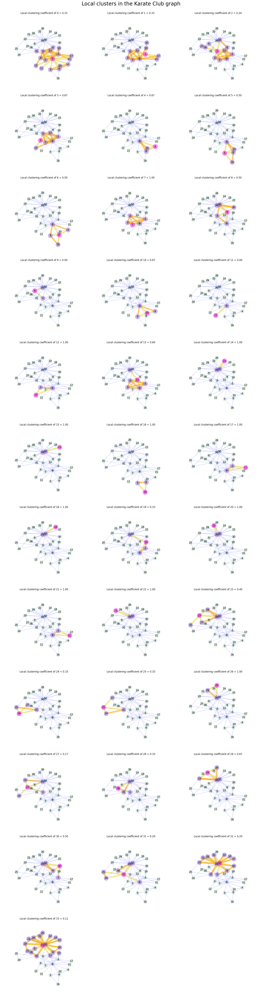

In [28]:
G=nx.karate_club_graph()
name = "Karate Club graph"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)
plot_local_clusters(G, name)

### An Undirected Erdos-Renyi Random Graph

Global clustering coefficient of the Erdos-Renyi random graph = 0.19
Average clustering coefficient of the Erdos-Renyi random graph = 0.21


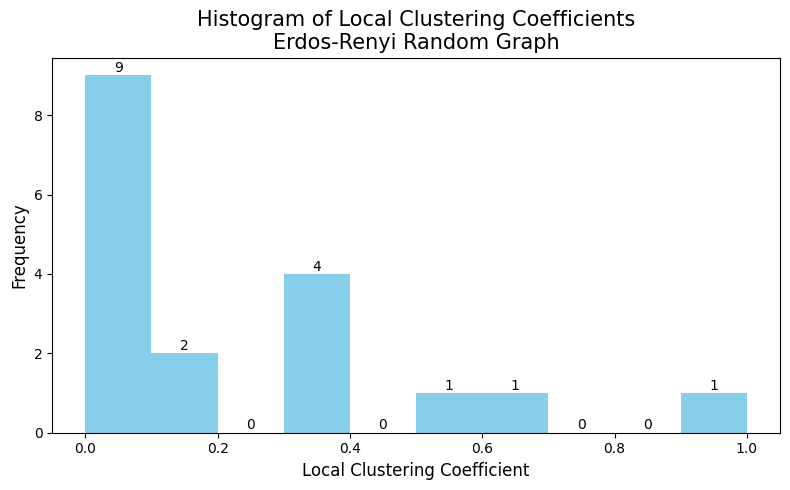

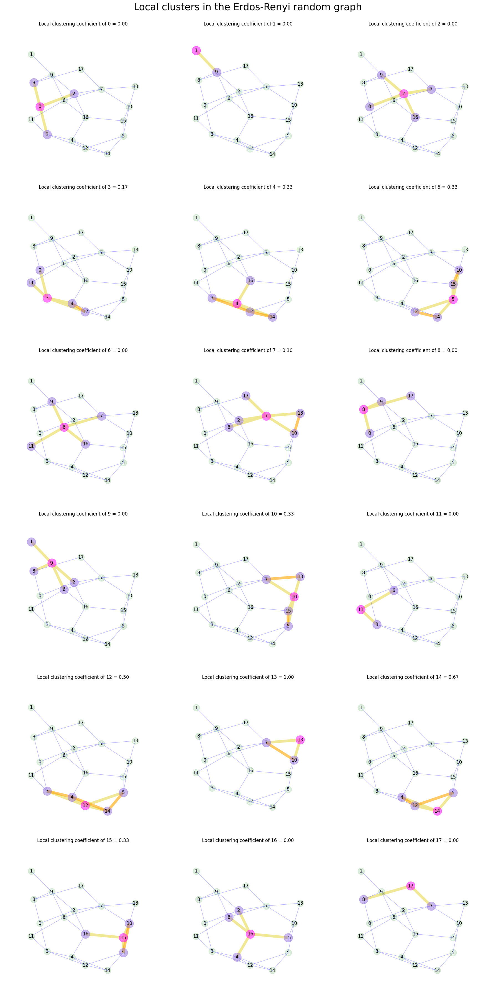

In [29]:
while True:
    n=random.randint(12,18)
    p=random.uniform(0.1,0.2)
    G = nx.erdos_renyi_graph(n,p)
    if nx.is_connected(G)==True:
        break
name = "Erdos-Renyi random graph"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)
plot_local_clusters(G, name)

### Barabasi-Albert Graph

#### Definition of a Barabási–Albert Graph

A **Barabási–Albert (BA) graph** is a type of random graph that models a **scale-free network** through **preferential attachment**. It is formally defined by the following properties and process:

- **Growth**: Nodes are added to the graph one at a time.

- **Preferential Attachment**: When a new node is added, it forms connections (edges) to a fixed number of existing nodes, where the probability of connecting to a specific existing node $v$ is proportional to the current degree of $v$. This means that nodes with higher degrees are more likely to attract new edges, forming hubs.

- **Parameters**:
  - $n$: The total number of nodes in the graph.
  - $m$: The number of edges each new node will create with the existing nodes, where $1 \leq m < n$.

- **Edge Probability**: The probability $P$ that a new node $i$ will connect to an existing node $j$ with degree $k_j$ is given by:

  $$
  P(i \rightarrow j) = \frac{k_j}{\sum_{v \in V} k_v}
  $$

  where $\sum_{v \in V} k_v$ is the sum of degrees of all existing nodes in the graph. This creates a "rich-get-richer" effect, causing high-degree nodes to attract even more connections.

#### Properties of a BA Graph

- **Scale-Free Degree Distribution**: The degree distribution follows a power law, $P(k) \sim k^{-\gamma}$, typically with $\gamma \approx 3$.
- **High Clustering Coefficient**: BA graphs often exhibit a high clustering coefficient compared to random graphs of similar size.
- **Emergent Hubs**: Due to preferential attachment, a few nodes will have very high degrees (hubs), while most nodes will have low degrees.

#### Construction Process

1. **Initialize** with a small number of nodes $m_0$ (typically $m_0 \geq m$) that are all connected to each other.

2. **Iterate** for each new node $i = m_0 + 1, m_0 + 2, \ldots, n$:
   - Add the new node $i$.
   - Connect $i$ to $m$ existing nodes, where the probability of choosing each existing node $j$ is proportional to its degree $k_j$.

This iterative, probabilistic attachment process results in a graph with a **scale-free, heavy-tailed degree distribution** that models many real-world networks, such as social and biological networks.


Global clustering coefficient of the Barabasi-Albert graph = 0.49
Average clustering coefficient of the Barabasi-Albert graph = 0.55


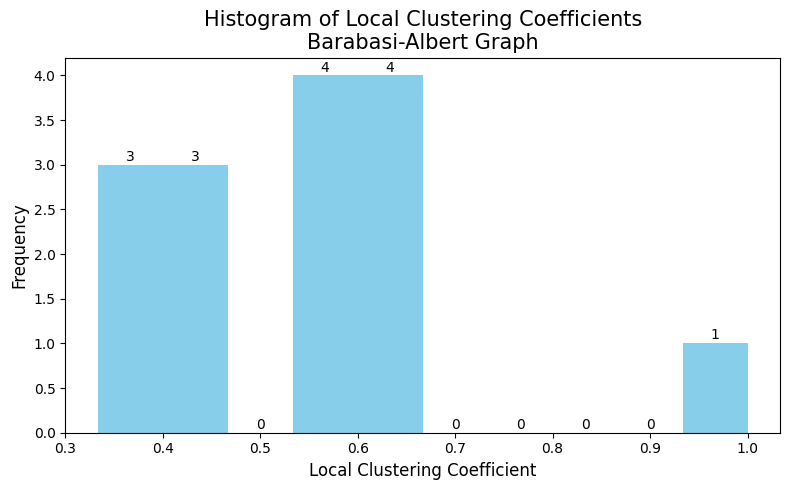

In [30]:
G = nx.barabasi_albert_graph(n=15, m=5)
name = "Barabasi-Albert graph"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

### The Dolphins Graph

Global clustering coefficient of the Dolphins graph = 0.31
Average clustering coefficient of the Dolphins graph = 0.26


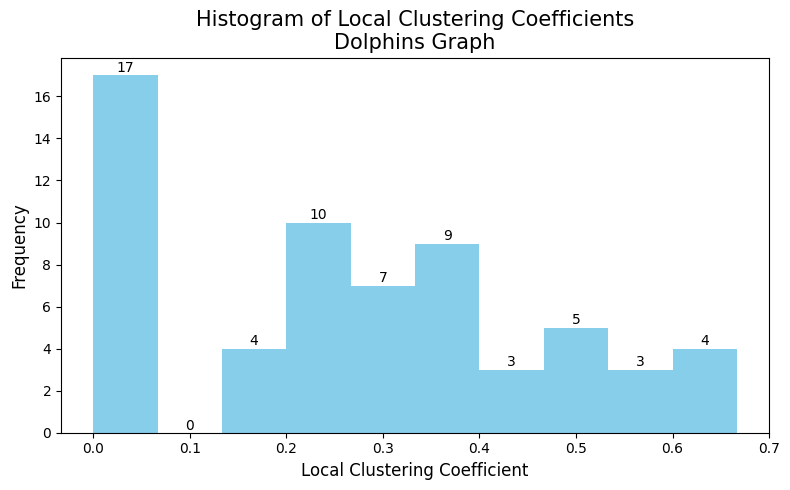

In [31]:
G = nx.read_gml("dolphins.gml")
name="Dolphins graph"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

### The Graph of Les Miserables

Global clustering coefficient of the graph of Les Miserables = 0.50
Average clustering coefficient of the graph of Les Miserables = 0.57


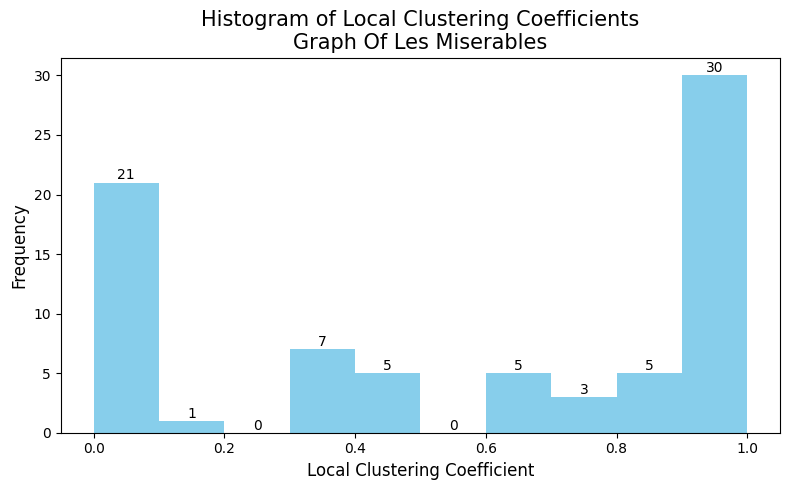

In [32]:
G=nx.les_miserables_graph()
name="graph of Les Miserables"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

### The Graph of American Football Games

Global clustering coefficient of the graph of American Football Games = 0.41
Average clustering coefficient of the graph of American Football Games = 0.40


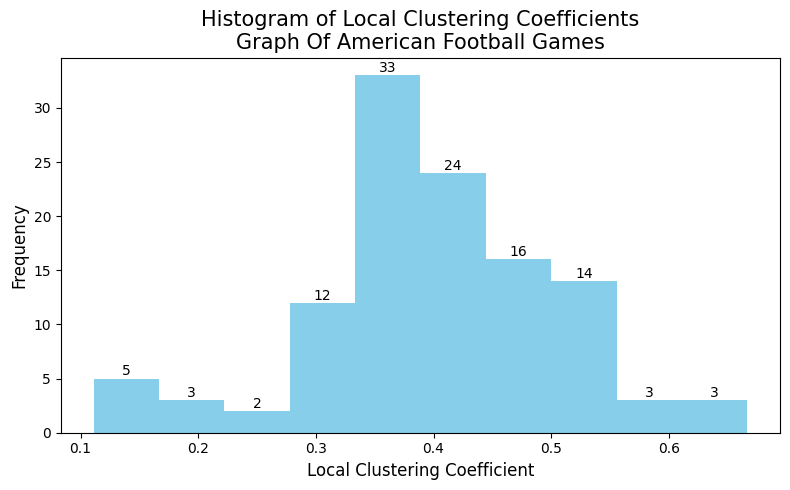

In [33]:
with open("AmericanFootballGraph.pickle", "rb") as f:
    G = pickle.load(f)
name="graph of American Football Games"
    
print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

### The Graph of Jazz Musicians

Global clustering coefficient of the graph of Jazz Musicians = 0.52
Average clustering coefficient of the graph of Jazz Musicians = 0.62


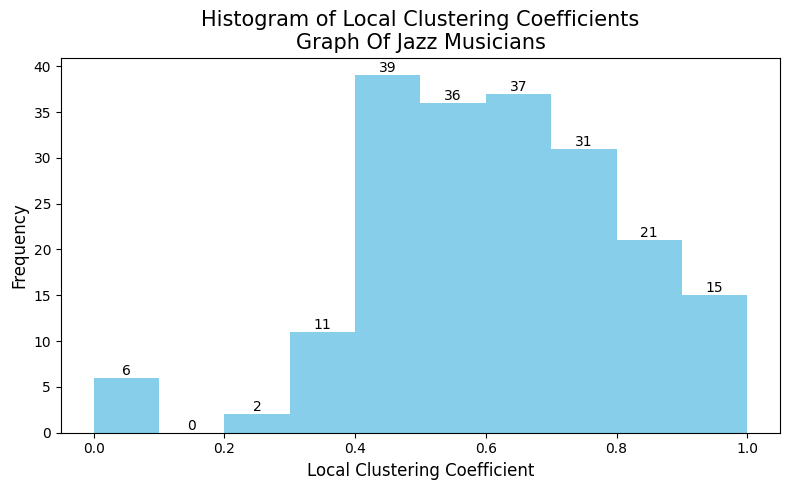

In [34]:
with open("jazz.pickle", "rb") as f:
    G = pickle.load(f)
name="graph of Jazz Musicians"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

### The Graph of LastFM Asia Friends

Global clustering coefficient of the graph of LastFM Asia Friends = 0.18
Average clustering coefficient of the graph of LastFM Asia Friends = 0.22


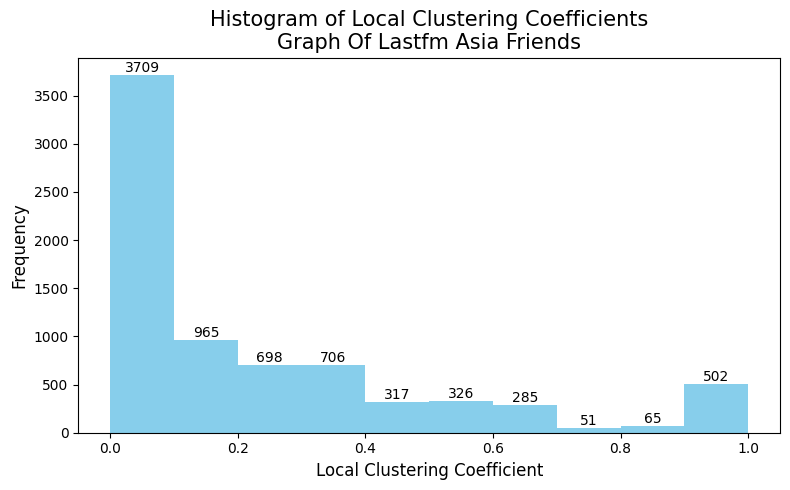

In [35]:
with open("LastFMAsiaSN.pickle", "rb") as f:
    G = pickle.load(f)

name="graph of LastFM Asia Friends"

print(f"Global clustering coefficient of the {name} = {global_clustering_coefficient(G):.2f}")
print(f"Average clustering coefficient of the {name} = {nx.average_clustering(G):.2f}")

plot_clustering_coefficient_histogram(G, name, bins=10)

<a id='3'></a>
## <span style="color:green">3. Triangles</span>

Let $G$ be a graph and $u$ a node.


* A **triangle** is formed by three nodes (called *vertices*) and three edges (called *sides*) that are joining every pair of these three nodes. When $u$ is one of the vertices of a triangle, the triangle is said to pass from $u$. 


* The **transitivity** of graph $G$ is defined as the ratio of the number of triangles divided by the number of all possible triangles. Notice that the number of all possible triangles is equal to the number of all existring *triads* in $G$, where a triad is defined as two edges with a shared node.

### The Florentine Families Graph

There are 3 triangles in the Florentine Families graph:
[('Medici', 'Ridolfi', 'Tornabuoni'), ('Castellani', 'Peruzzi', 'Strozzi'), ('Bischeri', 'Peruzzi', 'Strozzi')]
Transitivity of the Florentine Families graph = 0.191


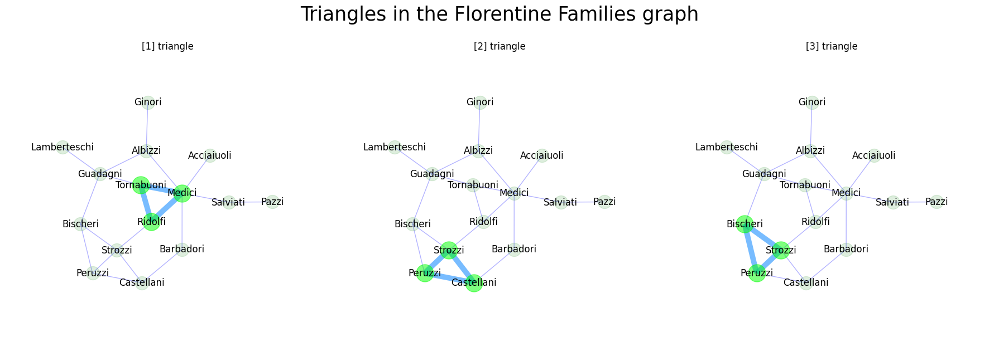

In [36]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}:\n{triangles}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

plot_triangles(G, name, h=1)

### The Karate Club Graph

There are 45 triangles in the Karate Club graph:
[(0, 1, 2), (0, 1, 3), (0, 1, 7), (0, 1, 13), (0, 1, 17), (0, 1, 19), (0, 1, 21), (0, 2, 3), (0, 2, 7), (0, 2, 8), (0, 2, 13), (0, 3, 7), (0, 3, 12), (0, 3, 13), (0, 4, 6), (0, 4, 10), (0, 5, 6), (0, 5, 10), (1, 2, 3), (1, 2, 7), (1, 2, 13), (1, 3, 7), (1, 3, 13), (2, 3, 7), (2, 3, 13), (2, 8, 32), (5, 6, 16), (8, 30, 32), (8, 30, 33), (8, 32, 33), (14, 32, 33), (15, 32, 33), (18, 32, 33), (20, 32, 33), (22, 32, 33), (23, 27, 33), (23, 29, 32), (23, 29, 33), (23, 32, 33), (24, 25, 31), (26, 29, 33), (28, 31, 33), (29, 32, 33), (30, 32, 33), (31, 32, 33)]
Transitivity of the Karate Club graph = 0.256


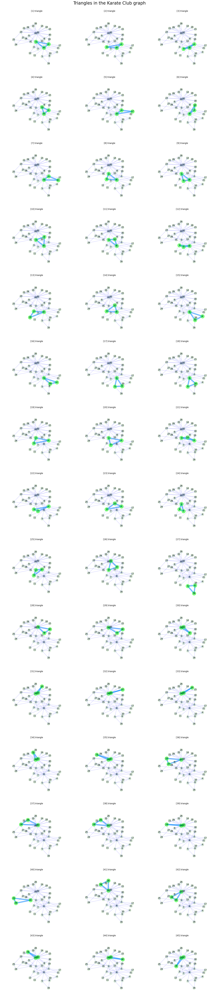

In [37]:
G=nx.karate_club_graph()
name = "Karate Club graph"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}:\n{triangles}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

plot_triangles(G, name, h=6)

### Barabasi-Albert Graph

There are 18 triangles in the Barabasi-Albert graph:
[(0, 1, 6), (0, 1, 13), (0, 2, 9), (0, 2, 13), (0, 3, 7), (0, 3, 8), (0, 6, 7), (0, 8, 9), (1, 4, 5), (1, 5, 6), (1, 5, 11), (1, 13, 14), (2, 4, 5), (2, 4, 12), (2, 9, 12), (3, 4, 8), (3, 4, 10), (4, 5, 10)]
Transitivity of the Barabasi-Albert graph = 0.342


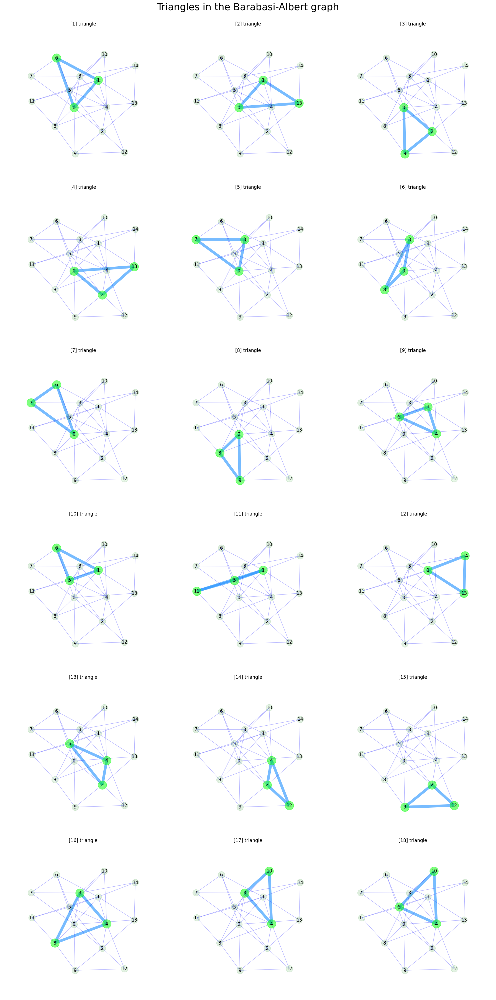

In [38]:
G = nx.barabasi_albert_graph(n=15, m=3)
name = "Barabasi-Albert graph"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}:\n{triangles}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

plot_triangles(G, name, h=6)

### The Dolphins Graph

In [39]:
G = nx.read_gml("dolphins.gml")
name="Dolphins graph"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

There are 95 triangles in the Dolphins graph
Transitivity of the Dolphins graph = 0.309


### The Graph of Les Miserables

In [40]:
G=nx.les_miserables_graph()
name="graph of Les Miserables"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

There are 467 triangles in the graph of Les Miserables
Transitivity of the graph of Les Miserables = 0.499


### The Graph of American Football Games

In [41]:
with open("AmericanFootballGraph.pickle", "rb") as f:
    G = pickle.load(f)
name="graph of American Football Games"

triangles,nc=all_unique_triangles(G)
print(f"There are {nc} triangles in the {name}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

There are 810 triangles in the graph of American Football Games
Transitivity of the graph of American Football Games = 0.407


### The Graph of Jazz Musicians

In [42]:
with open("jazz.pickle", "rb") as f:
    G = pickle.load(f)
name="graph of Jazz Musicians"

nc=count_unique_triangles(G)
print(f"There are {nc} triangles in the {name}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

There are 17899 triangles in the graph of Jazz Musicians
Transitivity of the graph of Jazz Musicians = 0.520


### The Graph of LastFM Asia Friends

In [43]:
with open("LastFMAsiaSN.pickle", "rb") as f:
    G = pickle.load(f)
name="graph of LastFM Asia Friends"

nc=count_unique_triangles(G)
print(f"There are {nc} triangles in the {name}")
print(f"Transitivity of the {name} = {nx.transitivity(G):.3f}")

There are 40433 triangles in the graph of LastFM Asia Friends
Transitivity of the graph of LastFM Asia Friends = 0.179


<a id='4'></a>
## <span style="color:green">4. Cycles</span>

Let $G = (V, E)$ be an undirected graph (generalizations to directed graphs can be similarly constructed).

**Walk**: A walk is a equence of edges which join a sequence of vertices. Formally, a walk is a sequence of edges $e_1, e_2, \ldots, e_k$, for which there is a sequence of vertices $v_1, v_2, \ldots, v_{k+1}$ such that $e_i = (v_i, v_{i + 1})$, for $i = 1, 2, \ldots, k$. *Both vertices and edges can be repeated in a walk*. A walk is called **closed** if it starts and ends at the same vertex (i.e., $v_{k+1} = v_1$).

**Trail**: A trail is a walk in which all edges are distinct (but *vertices can be repeated in a trail*). A trail is called **closed** if it starts and ends at the same vertex.

**Path**: A path is a trail in which all vertices (and therefore also all edges) are distinct. In other words, *no vertices nor edges can be repeated in a path*, unless it is a **closed path** in which case the only vertices that are repeated are the first and the last vertex.

**Cycle:** A cycle is a closed trail in which the first and last vertices are equal (while *all other vertices can be repeated in a cycle*).

**Simple cycle**: A simple cycle is a closed trail in which only the first and last vertices are equal (while *no other vertices can be repeated in a simple cycle*). In other words, *a simple cycle is a closed path* (in the context of the previous definitions).

<u>In our discussion here, even when it is not mentioned explicitly, all cycles considered will be simple cycles.</u>

**Length** of walks / trails / paths / cycles / simple cycles: The length of all these objects is the cardinality (size) of the sequence of edges that defines them. Thus, by $k$-walks / $k$-trails / $k$-paths / $k$-cycles / $k$-simple cycles, one understands that the length of these is $k$. Apparently:

* $3$-cycles are **triangles**,
* $4$-cycles are **quadrangles**,
* $5$-cycles are **pentagons**,
* $6$-cycles are **hexagons**, etc.

### The Florentine Families Graph

In [44]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

cy_d=all_cycles(G,name)
print(f"The {name} contains:")
for k,v in cy_d.items():
    print(f"{len(v)} {k}-cycles:\n{v}")

The Florentine Families graph contains:
1 10-cycles:
[['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Bischeri', 'Strozzi', 'Ridolfi', 'Tornabuoni', 'Guadagni', 'Albizzi']]
4 9-cycles:
[['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Strozzi', 'Ridolfi', 'Tornabuoni', 'Guadagni', 'Albizzi'], ['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Strozzi', 'Bischeri', 'Guadagni', 'Tornabuoni', 'Ridolfi'], ['Medici', 'Barbadori', 'Castellani', 'Strozzi', 'Peruzzi', 'Bischeri', 'Guadagni', 'Tornabuoni', 'Ridolfi'], ['Medici', 'Tornabuoni', 'Ridolfi', 'Strozzi', 'Castellani', 'Peruzzi', 'Bischeri', 'Guadagni', 'Albizzi']]
11 8-cycles:
[['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Strozzi', 'Bischeri', 'Guadagni', 'Tornabuoni'], ['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Strozzi', 'Bischeri', 'Guadagni', 'Albizzi'], ['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Bischeri', 'Strozzi', 'Ridolfi', 'Tornabuoni'], ['Medici', 'Barbadori', 'Castellani', 'Peruzzi', 'Bischeri', 'Guadag

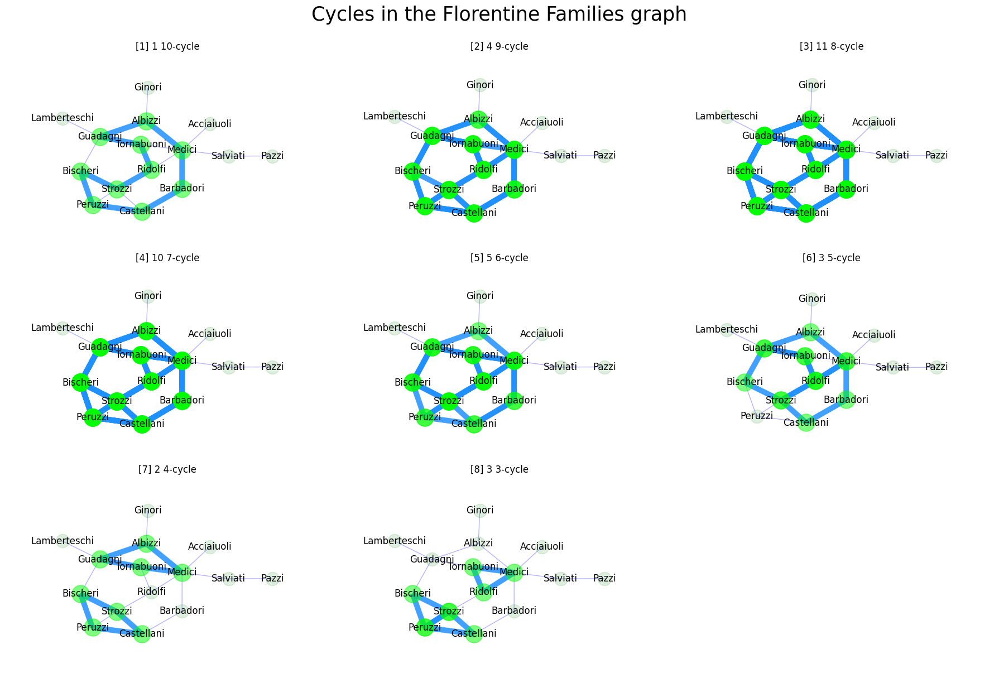

In [45]:
plot_cycles(G, name, h=2)

### The Karate Club Graph

In [46]:
G=nx.karate_club_graph()
name = "Karate Club graph"

cy_d=all_cycles(G,name)
print(f"The {name} contains:")
for k,v in cy_d.items():
    print(f"{len(v)} {k}-cycles")

The Karate Club graph contains:
120 20-cycles
1733 19-cycles
10751 18-cycles
37264 17-cycles
82339 16-cycles
125021 15-cycles
138689 14-cycles
120823 13-cycles
89849 12-cycles
59890 11-cycles
35127 10-cycles
17625 9-cycles
7507 8-cycles
2746 7-cycles
969 6-cycles
374 5-cycles
154 4-cycles
45 3-cycles


### Barabasi-Albert Graph

In [47]:
G = nx.barabasi_albert_graph(n=15, m=3)
name = "Barabasi-Albert graph"

cy_d=all_cycles(G,name)
print(f"The {name} contains:")
for k,v in cy_d.items():
    print(f"{len(v)} {k}-cycles")

The Barabasi-Albert graph contains:
121 15-cycles
691 14-cycles
1828 13-cycles
3016 12-cycles
3542 11-cycles
3181 10-cycles
2282 9-cycles
1383 8-cycles
717 7-cycles
337 6-cycles
145 5-cycles
54 4-cycles
19 3-cycles


<a id='5'></a>
## <span style="color:green">5. Ego-nets</span>

### The Florentine Families Graph

11 nontrivial ego-nets of the Florentine Families graph


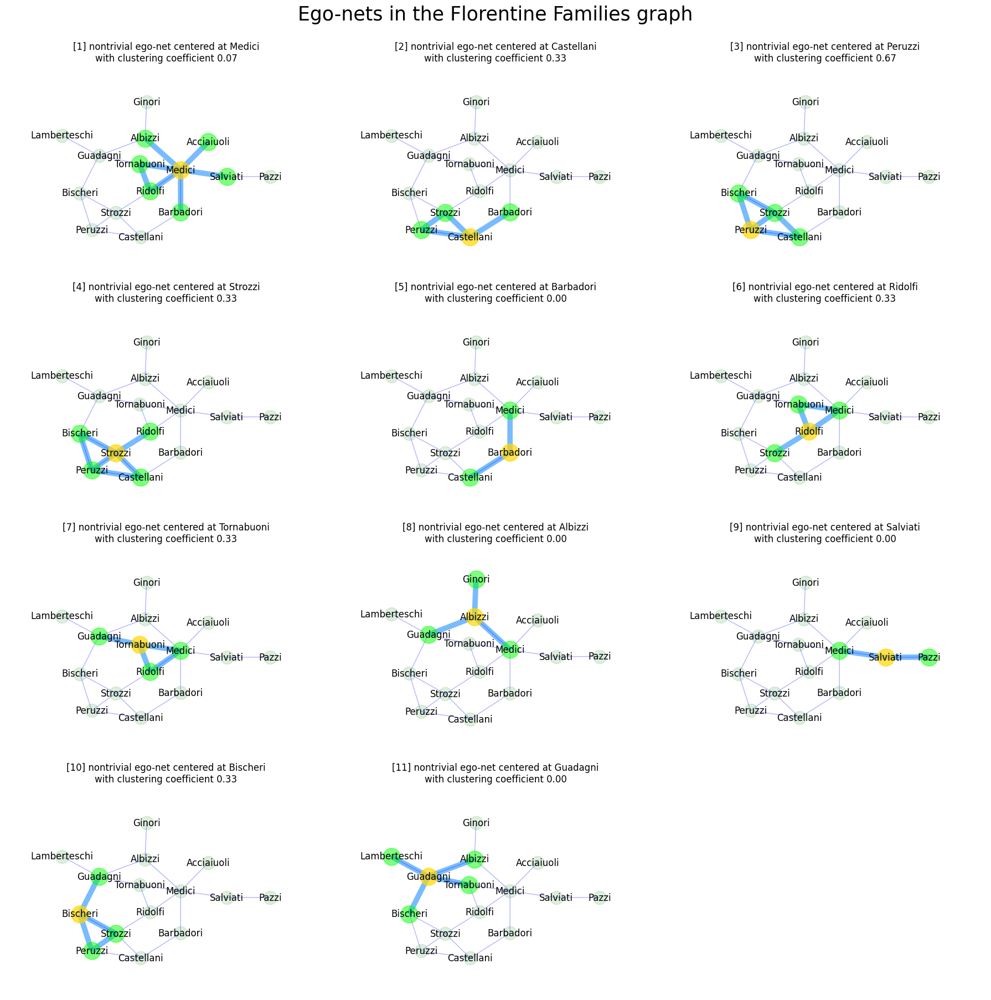

In [48]:
G=nx.florentine_families_graph()
name = "Florentine Families graph"

plot_egonets(G, name, h=3)

### The Karate Club Graph

33 nontrivial ego-nets of the Karate Club graph


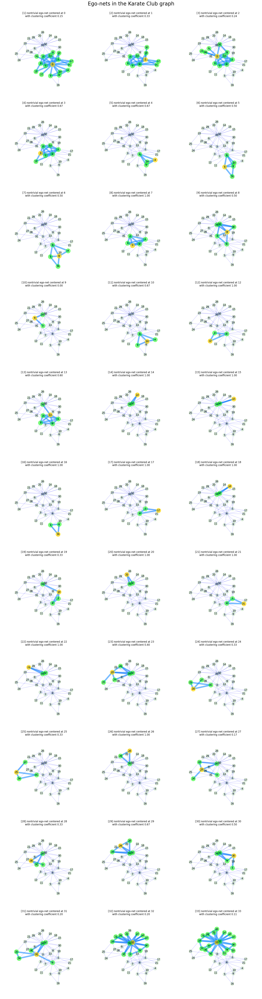

In [49]:
G=nx.karate_club_graph()
name = "Karate Club graph"

plot_egonets(G, name, h=5)

### Barabasi-Albert Graph

15 nontrivial ego-nets of the Barabasi-Albert graph


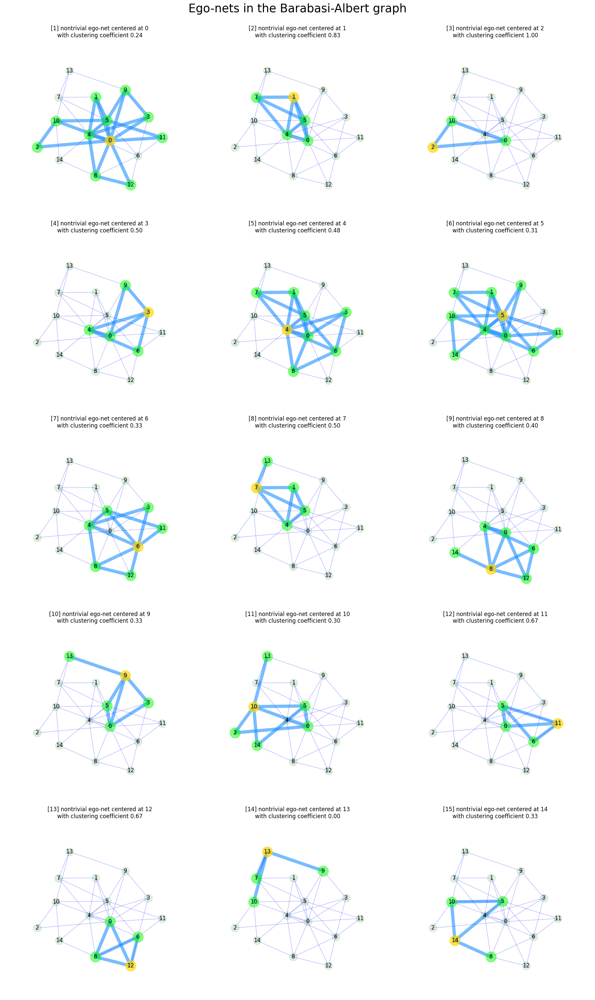

In [50]:
G = nx.barabasi_albert_graph(n=15, m=3)
name = "Barabasi-Albert graph"

plot_egonets(G, name, h=5)